# Urban Air Pollution

In parts of many African cities, air quality seems to be getting worse as more people stay at home. The objective of this project is to dig deeper into the data, finding ways to track air quality and how it is changing, even in places without ground-based sensors. This information will be especially useful in the face of the current crisis, since poor air quality makes a respiratory disease like COVID-19 more dangerous.

Weather data and daily observations have been collected from the Sentinel 5P satellite tracking various pollutants in the atmosphere. The goal is to use this information to predict PM2.5 particulate matter concentration (a common measure of air quality that normally requires ground-based sensors to measure) every day for each city. The data covers the last three months, spanning hundreds of cities across the globe.

# Importing necessary library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
sb.set()

# Loading the data

In [2]:
train= pd.read_csv('Train.csv')
test= pd.read_csv('Test.csv')

# Making a copy of the data to preserve the contents of the original data

In [3]:
train_data= train.copy()
test_data= test.copy()

# Displaying the data frames

In [4]:
train_data.head()

,Place_ID X Date,Date,Place_ID,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,...,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle,L3_CH4_CH4_column_volume_mixing_ratio_dry_air,L3_CH4_aerosol_height,L3_CH4_aerosol_optical_depth,L3_CH4_sensor_azimuth_angle,L3_CH4_sensor_zenith_angle,L3_CH4_solar_azimuth_angle,L3_CH4_solar_zenith_angle
0,010Q650 X 2020-01-02,2020-01-02,010Q650,38.0,23.0,53.0,769.50,92,11.000000,60.200001,...,38.593017,-61.752587,22.363665,1793.793579,3227.855469,0.010579,74.481049,37.501499,-62.142639,22.545118
1,010Q650 X 2020-01-03,2020-01-03,010Q650,39.0,25.0,63.0,1319.85,91,14.600000,48.799999,...,59.624912,-67.693509,28.614804,1789.960449,3384.226562,0.015104,75.630043,55.657486,-53.868134,19.293652
2,010Q650 X 2020-01-04,2020-01-04,010Q650,24.0,8.0,56.0,1181.96,96,16.400000,33.400002,...,49.839714,-78.342701,34.296977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,010Q650 X 2020-01-05,2020-01-05,010Q650,49.0,10.0,55.0,1113.67,96,6.911948,21.300001,...,29.181258,-73.896588,30.545446,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,010Q650 X 2020-01-06,2020-01-06,010Q650,21.0,9.0,52.0,1164.82,95,13.900001,44.700001,...,0.797294,-68.612480,26.899694,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
test_data.head()

,Place_ID X Date,Date,Place_ID,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground,L3_NO2_NO2_column_number_density,...,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle,L3_CH4_CH4_column_volume_mixing_ratio_dry_air,L3_CH4_aerosol_height,L3_CH4_aerosol_optical_depth,L3_CH4_sensor_azimuth_angle,L3_CH4_sensor_zenith_angle,L3_CH4_solar_azimuth_angle,L3_CH4_solar_zenith_angle
0,0OS9LVX X 2020-01-02,2020-01-02,0OS9LVX,11.600000,30.200001,0.00409,14.656824,3.956377,0.712605,0.000053,...,1.445658,-95.984984,22.942019,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0OS9LVX X 2020-01-03,2020-01-03,0OS9LVX,18.300001,42.900002,0.00595,15.026544,4.230430,0.661892,0.000050,...,34.641758,-95.014908,18.539116,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0OS9LVX X 2020-01-04,2020-01-04,0OS9LVX,17.600000,41.299999,0.00590,15.511041,5.245728,1.640559,0.000050,...,55.872276,-94.015418,14.140820,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0OS9LVX X 2020-01-05,2020-01-05,0OS9LVX,15.011948,53.100002,0.00709,14.441858,5.454001,-0.190532,0.000055,...,59.174188,-97.247602,32.730553,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0OS9LVX X 2020-01-06,2020-01-06,0OS9LVX,9.700000,71.599998,0.00808,11.896295,3.511787,-0.279441,0.000055,...,40.925873,-96.057265,28.320527,1831.261597,3229.118652,0.031068,-100.278343,41.84708,-95.910744,28.498789


# Checking the shape of the data

In [6]:
print(train_data.shape)
print(test_data.shape)

(30557, 82)
(16136, 77)


# converting the date feature to date time format

In [7]:
train_data['Date']= pd.to_datetime(train_data['Date'])
test_data['Date']= pd.to_datetime(test_data['Date'])

In [8]:
train_data.Date.info()

<class 'pandas.core.series.Series'>
RangeIndex: 30557 entries, 0 to 30556
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
30557 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 238.9 KB


# setting the date feature as the index column

In [9]:
train_data.set_index(['Date', 'Place_ID'], inplace=True)
test_copy= test_data.copy()
test_copy.set_index(['Date', 'Place_ID'], inplace=True)
train_data.head()

,,Place_ID X Date,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,...,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle,L3_CH4_CH4_column_volume_mixing_ratio_dry_air,L3_CH4_aerosol_height,L3_CH4_aerosol_optical_depth,L3_CH4_sensor_azimuth_angle,L3_CH4_sensor_zenith_angle,L3_CH4_solar_azimuth_angle,L3_CH4_solar_zenith_angle
Date,Place_ID,,,,,,,,,,,,,,,,,,,,,
2020-01-02,010Q650,010Q650 X 2020-01-02,38.0,23.0,53.0,769.50,92,11.000000,60.200001,0.00804,18.516840,...,38.593017,-61.752587,22.363665,1793.793579,3227.855469,0.010579,74.481049,37.501499,-62.142639,22.545118
2020-01-03,010Q650,010Q650 X 2020-01-03,39.0,25.0,63.0,1319.85,91,14.600000,48.799999,0.00839,22.546533,...,59.624912,-67.693509,28.614804,1789.960449,3384.226562,0.015104,75.630043,55.657486,-53.868134,19.293652
2020-01-04,010Q650,010Q650 X 2020-01-04,24.0,8.0,56.0,1181.96,96,16.400000,33.400002,0.00750,27.031030,...,49.839714,-78.342701,34.296977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-05,010Q650,010Q650 X 2020-01-05,49.0,10.0,55.0,1113.67,96,6.911948,21.300001,0.00391,23.971857,...,29.181258,-73.896588,30.545446,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-06,010Q650,010Q650 X 2020-01-06,21.0,9.0,52.0,1164.82,95,13.900001,44.700001,0.00535,16.816309,...,0.797294,-68.612480,26.899694,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Analyzing missing values and the count & percentage of missing values for each feature and the entire data frame

In [10]:
def null_analyzer(data):
    total_null = data.isna().sum().sum()
    total_percent = (total_null/len(data))*100
    print('lenght of data frame with missing values:', len(data))
    print('total missing values:', total_null)
    print('total percentage :', total_percent)
    print(' ')
    
    high_null_col= []
    for col in data.columns:
        null_vals = data[col].isna().sum()
        null_percent = round((null_vals/len(data))*100, 2)
        if null_percent >= 50:
            high_null_col.append(col)
    
        print('Column name:', col)
        print('number of missing values:', null_vals)
        print('percentage of missing values:', null_percent)
        print(' ')
    
    print(high_null_col)

The analysis of the missing values shows that seven(7) features consist of missing values with over 50%, twenty six (26) features with less than 50% and more than 10% of missing values and fourty eight (48) features with less than 10% of missing values

The features consisting of missing values with over 50% will be dropped while other features with less than 50% of missing values will be replaced using the forward fill technique

In [11]:
null_analyzer(train_data)

lenght of data frame with missing values: 30557
total missing values: 388262
total percentage : 1270.6155709002846
 
Column name: Place_ID X Date
number of missing values: 0
percentage of missing values: 0.0
 
Column name: target
number of missing values: 0
percentage of missing values: 0.0
 
Column name: target_min
number of missing values: 0
percentage of missing values: 0.0
 
Column name: target_max
number of missing values: 0
percentage of missing values: 0.0
 
Column name: target_variance
number of missing values: 0
percentage of missing values: 0.0
 
Column name: target_count
number of missing values: 0
percentage of missing values: 0.0
 
Column name: precipitable_water_entire_atmosphere
number of missing values: 0
percentage of missing values: 0.0
 
Column name: relative_humidity_2m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name: specific_humidity_2m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name

 The analysis of the missing values shows that seven(7) features consist of missing values with over 50%, twenty six (26) features with less than 50% and more than 10% of missing values and fourty eight (48) features with less than 10% of missing values

The features consisting of missing values with over 50% will be dropped while other features with less than 50% of missing values will be replaced using the forward fill technique

# Dropping features with over 50% of missing values

In [12]:
high_null_col= ['L3_CH4_CH4_column_volume_mixing_ratio_dry_air', 'L3_CH4_aerosol_height', 'L3_CH4_aerosol_optical_depth',
                'L3_CH4_sensor_azimuth_angle', 'L3_CH4_sensor_zenith_angle',
                'L3_CH4_solar_azimuth_angle', 'L3_CH4_solar_zenith_angle']
train_data.drop(columns= high_null_col, inplace= True)
train_data.head()

,,Place_ID X Date,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
Date,Place_ID,,,,,,,,,,,,,,,,,,,,,
2020-01-02,010Q650,010Q650 X 2020-01-02,38.0,23.0,53.0,769.50,92,11.000000,60.200001,0.00804,18.516840,...,22.358167,-0.000127,0.312521,-0.000040,-1.861476,0.000000,76.536426,38.593017,-61.752587,22.363665
2020-01-03,010Q650,010Q650 X 2020-01-03,39.0,25.0,63.0,1319.85,91,14.600000,48.799999,0.00839,22.546533,...,28.614804,0.000150,0.433957,0.000050,-1.452612,0.059433,-14.708036,59.624912,-67.693509,28.614804
2020-01-04,010Q650,010Q650 X 2020-01-04,24.0,8.0,56.0,1181.96,96,16.400000,33.400002,0.00750,27.031030,...,34.296977,0.000150,0.356925,0.000053,-1.572950,0.082063,-105.201338,49.839714,-78.342701,34.296977
2020-01-05,010Q650,010Q650 X 2020-01-05,49.0,10.0,55.0,1113.67,96,6.911948,21.300001,0.00391,23.971857,...,30.545393,0.000227,0.584522,0.000110,-1.239317,0.121261,-104.334066,29.181258,-73.896588,30.545446
2020-01-06,010Q650,010Q650 X 2020-01-06,21.0,9.0,52.0,1164.82,95,13.900001,44.700001,0.00535,16.816309,...,26.899694,0.000390,0.408047,0.000159,0.202489,0.037919,58.850179,0.797294,-68.612480,26.899694


In [13]:
null_analyzer(test_data)

lenght of data frame with missing values: 16136
total missing values: 215137
total percentage : 1333.2734258800197
 
Column name: Place_ID X Date
number of missing values: 0
percentage of missing values: 0.0
 
Column name: Date
number of missing values: 0
percentage of missing values: 0.0
 
Column name: Place_ID
number of missing values: 0
percentage of missing values: 0.0
 
Column name: precipitable_water_entire_atmosphere
number of missing values: 0
percentage of missing values: 0.0
 
Column name: relative_humidity_2m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name: specific_humidity_2m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name: temperature_2m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name: u_component_of_wind_10m_above_ground
number of missing values: 0
percentage of missing values: 0.0
 
Column name: v_component_of_wind_10m_above_ground
number of missing

In [14]:
test_copy.drop(columns= high_null_col, inplace= True)

# Filling missing values in the remaining features using the foward fill technique

In [15]:
train_data= train_data.fillna(method='ffill')
test_copy= test_data.fillna(method='ffill')

C:\Users\User\AppData\Local\Temp\ipykernel_14928\2838981462.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  train_data= train_data.fillna(method='ffill')
C:\Users\User\AppData\Local\Temp\ipykernel_14928\2838981462.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  test_copy= test_data.fillna(method='ffill')


# Checking the relationship between the Daily Average PM2.5 and the Daily Maximum, Daily Minimum, Daily Variance PM2.5

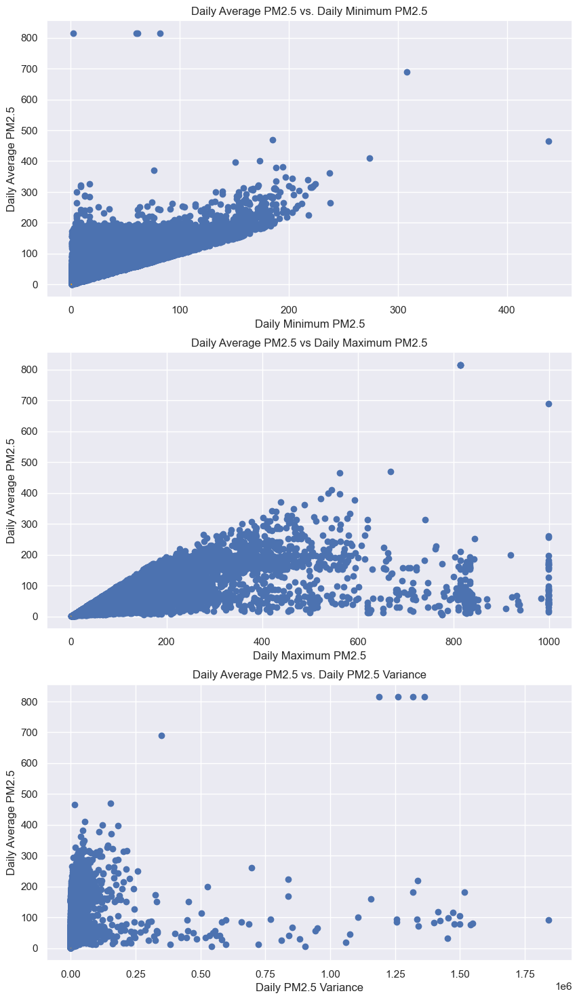

In [46]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 18))
ax[0].scatter(x= train_data['target_min'], y= train_data.target)
ax[0].plot([0.0, 1.0], [0.0,1.0], linestyle= '--', color= 'orange')
ax[0].set_xlabel('Daily Minimum PM2.5')
ax[0].set_ylabel('Daily Average PM2.5')
ax[0].set_title('Daily Average PM2.5 vs. Daily Minimum PM2.5');

ax[1].scatter(x= train_data['target_max'], y= train_data.target)
ax[1].plot([0.0, 1.0], [0.0,1.0], linestyle= '--', color= 'orange')
ax[1].set_xlabel('Daily Maximum PM2.5')
ax[1].set_ylabel('Daily Average PM2.5')
ax[1].set_title('Daily Average PM2.5 vs Daily Maximum PM2.5');

ax[2].scatter(x= train_data['target_variance'], y= train_data.target)
ax[2].plot([0.0, 1.0], [0.0,1.0], linestyle= '--', color= 'orange')
ax[2].set_xlabel('Daily PM2.5 Variance')
ax[2].set_ylabel('Daily Average PM2.5')
ax[2].set_title('Daily Average PM2.5 vs. Daily PM2.5 Variance');


The first plot, comparing daily minimum PM2.5 and daily average PM2.5, revealed a strong positive correlation. Days with higher minimum PM2.5 concentrations also tended to have higher daily average PM2.5 concentrations, suggesting that the minimum value is a contributing factor to the overall daily level.

The second plot, examining daily maximum PM2.5 against daily average PM2.5, also showed a strong positive correlation, even more pronounced than the first.  This indicates that the daily maximum PM2.5 is a significant driver of the daily average.  As expected, higher maximum values directly influence the overall average.

the third plot, comparing daily average PM2.5 and daily PM2.5 variance, showed a much weaker and less clear relationship. While there was a tendency for days with higher variance to sometimes have higher average PM2.5, this was not a consistent pattern.  Many days with high variance had relatively low or moderate average PM2.5. This suggests that while variance might play a role, it's not a direct or simple linear predictor of the daily average PM2.5.

# Inspecting Outliers

In [47]:
train_data.describe()

,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
count,30557.000000,30557.000000,30557.000000,3.055700e+04,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,...,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000
mean,61.148045,29.025866,117.992234,7.983756e+03,125.831135,15.302326,70.552747,0.006004,9.321342,0.416886,...,48.672064,0.000094,0.408598,0.000030,-1.910675,0.224298,-13.237656,34.741879,-121.675512,46.869293
std,46.861309,33.119775,100.417713,4.863090e+04,146.581856,10.688573,18.807884,0.003787,9.343226,2.707990,...,14.324508,0.001203,0.259702,0.000195,0.767436,0.163703,75.313891,19.413584,75.656067,16.389969
min,1.000000,1.000000,1.000000,0.000000e+00,2.000000,0.420044,5.128572,0.000139,-34.647879,-15.559646,...,8.251382,-0.038756,0.000000,-0.004309,-4.833706,0.000000,-111.997123,0.000000,-179.880630,0.000000
25%,25.000000,5.000000,60.000000,1.064920e+03,44.000000,7.666667,58.600002,0.003403,3.123071,-1.097864,...,38.233598,-0.000111,0.225298,-0.000044,-2.378308,0.079119,-97.298724,18.172742,-166.200811,36.998218
50%,50.000000,15.000000,91.000000,2.395350e+03,72.000000,12.200000,74.099998,0.004912,8.478424,0.222092,...,48.912729,0.000050,0.357105,0.000020,-1.957563,0.206966,-13.740583,36.985980,-157.173344,48.354595
75%,80.000000,44.000000,155.000000,5.882550e+03,150.000000,19.900000,85.450001,0.007562,16.201563,1.772925,...,59.260558,0.000294,0.536754,0.000099,-1.521101,0.363849,69.233894,51.859299,-113.823531,58.716514
max,815.000000,438.000000,999.000000,1.841490e+06,1552.000000,72.599998,100.000000,0.021615,37.437921,17.955124,...,87.491086,0.026994,2.184119,0.006988,3.736877,0.618176,80.544067,66.111289,179.776125,79.631711


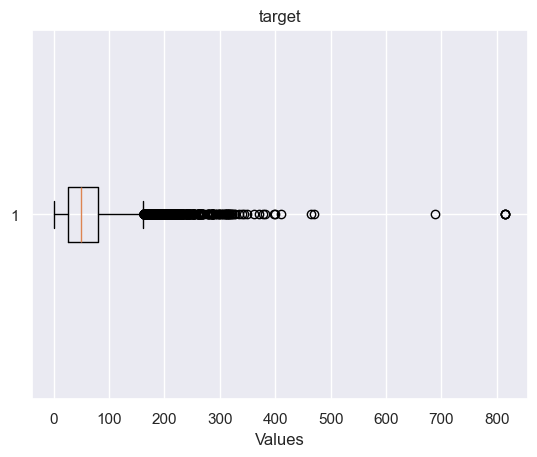

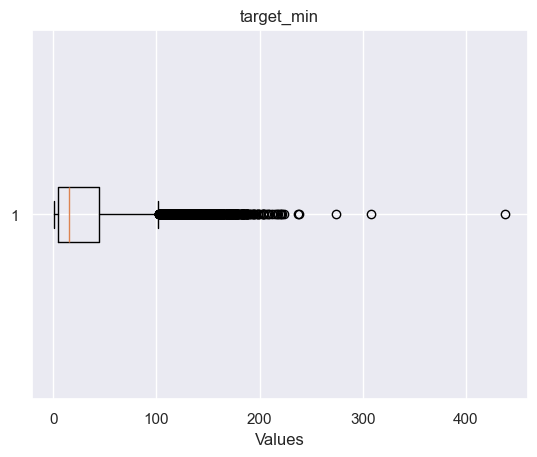

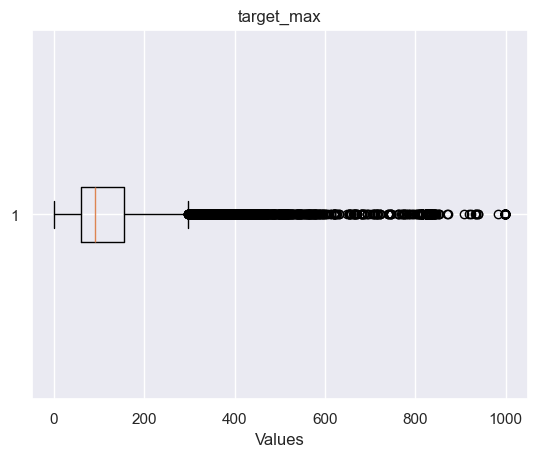

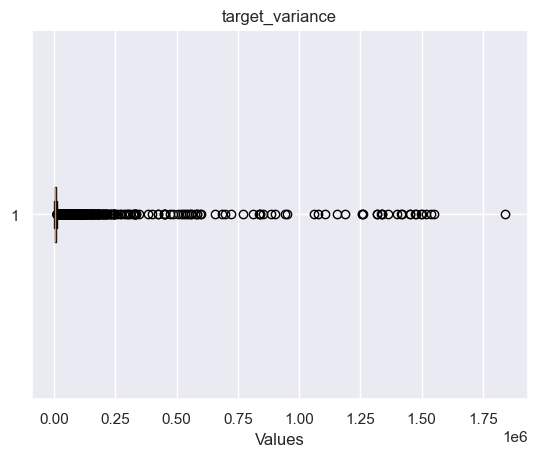

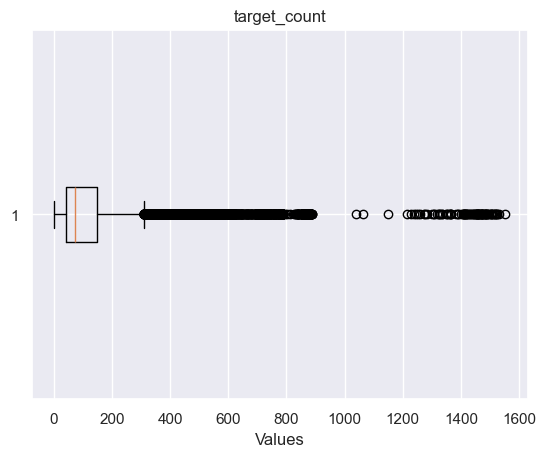

...

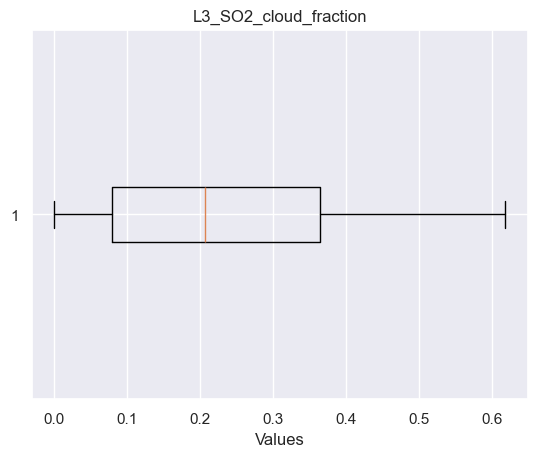

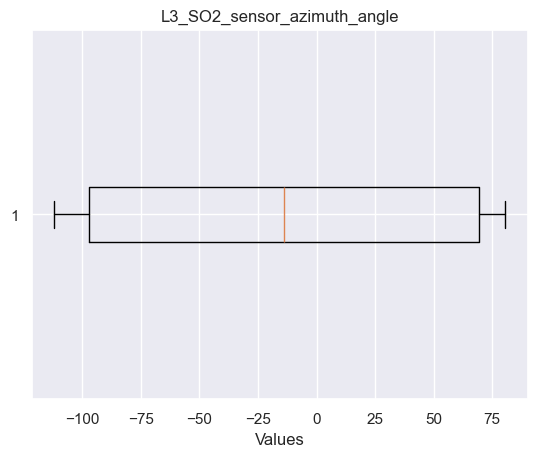

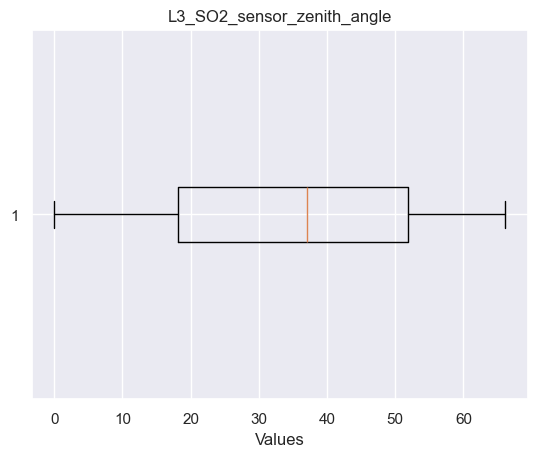

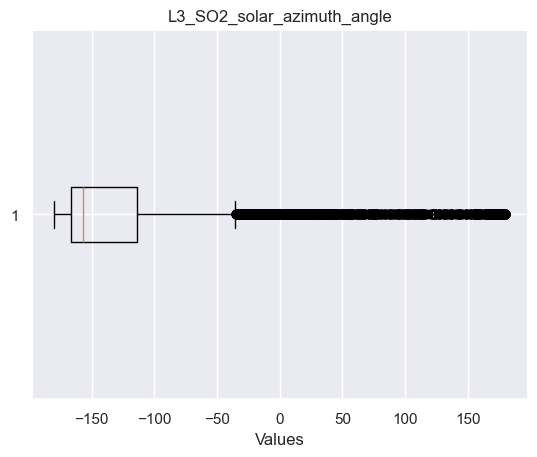

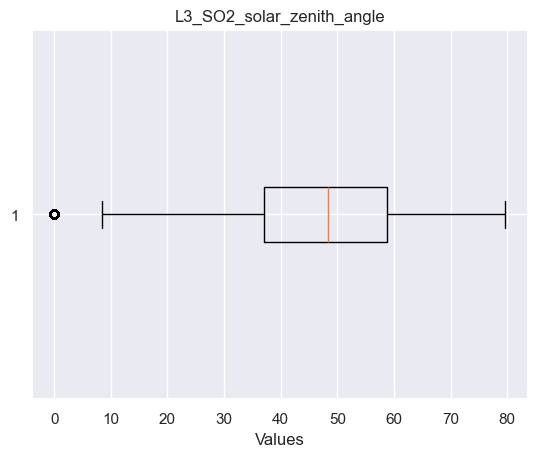

In [48]:
for col in train_data.select_dtypes(include='number').columns:
    plt.boxplot(train_data[col], vert= False)
    plt.title(col)
    plt.xlabel('Values')
    plt.show()

In [49]:
for col in train_data.select_dtypes(include='number').columns:
    q3, q1 = np.percentile(train_data[col], [75,25])
    iqr = q3 - q1
    upper_lim = q3 + 1.5 * iqr
    lower_lim = q1 - 1.5 * iqr
    
    total_outliers = len(train_data.loc[train_data[col] > upper_lim]) + len(train_data.loc[train_data[col] < lower_lim])
    percent_outliers = (total_outliers/len(train_data))*100

    print('column:', col)
    print('upper limit:', upper_lim)
    print('lower limit:', lower_lim)
    print('total outliers:', total_outliers)
    print('percent outliers:', percent_outliers)
    print('---------------------------')
    print(' ')

column: target
upper limit: 162.5
lower limit: -57.5
total outliers: 1201
percent outliers: 3.9303596557253657
---------------------------
 
column: target_min
upper limit: 102.5
lower limit: -53.5
total outliers: 1225
percent outliers: 4.008901397388486
---------------------------
 
column: target_max
upper limit: 297.5
lower limit: -82.5
total outliers: 1184
percent outliers: 3.8747259220473214
---------------------------
 
column: target_variance
upper limit: 13108.994999999999
lower limit: -6161.525
total outliers: 3081
percent outliers: 10.082796086003206
---------------------------
 
column: target_count
upper limit: 309.0
lower limit: -115.0
total outliers: 2538
percent outliers: 8.305789180875085
---------------------------
 
column: precipitable_water_entire_atmosphere
upper limit: 38.2499990463257
lower limit: -10.683332761128751
total outliers: 1437
percent outliers: 4.702686782079392
---------------------------
 
column: relative_humidity_2m_above_ground
upper limit: 125.72

In [16]:
train_data.dropna(inplace= True)
train_data.isna().sum().sum()


0

Several numerical features exhibited extreme values in their statistical distributions, raising concerns about the potential influence of outliers.  Boxplot analysis confirmed the presence of outliers, particularly in the readings for various air quality indicators.  To minimize the impact of these extreme values without significantly reducing the dataset size, an interquartile range (IQR) based approach was adopted.  Data points above the 90th percentile and below the 10th percentile were removed, allowing us to retain the majority of the data while mitigating the effects of the most extreme values.

# Removing outliers - values that are below 85 percentile and value that are below 15 percentile

In [17]:
clean_data = train_data.copy()

In [18]:
for col in clean_data.select_dtypes(include='number').columns:
    q3, q1 = np.percentile(clean_data[col], [85,15])
    iqr = q3 - q1
    upper_lim = q3 + 1.5 * iqr
    lower_lim = q1 - 1.5 * iqr
    
    clean_data.loc[clean_data[col] > upper_lim] = np.nan
    clean_data.loc[clean_data[col] < lower_lim] = np.nan

    clean_data.dropna(inplace= True)

In [53]:
clean_data.shape

(18468, 73)

In [54]:
test_data.shape

(16136, 68)

In [57]:
clean_data.describe()

,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
count,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,...,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000,18468.000000
mean,55.654933,26.748500,99.487075,3717.326480,105.405837,15.080344,69.411247,0.006183,10.170098,0.362896,...,47.580623,0.000087,0.427891,0.000025,-2.019421,0.205734,-15.093925,34.993979,-132.245207,47.098705
std,37.224767,27.258135,52.175894,3986.710855,90.775498,9.873474,18.745490,0.003665,8.676567,2.590306,...,12.801401,0.000386,0.231780,0.000106,0.638571,0.155679,76.546532,18.777891,57.446865,13.334231
min,1.000000,1.000000,1.000000,0.000000,2.000000,0.420044,7.942857,0.000319,-26.458695,-9.357020,...,8.703999,-0.001315,0.000000,-0.000386,-4.426772,0.000000,-108.466240,0.000000,-179.763427,0.000000
25%,25.000000,5.000000,59.000000,1024.220000,44.000000,7.800000,57.299999,0.003573,4.030954,-1.132001,...,38.615812,-0.000108,0.257600,-0.000043,-2.413351,0.070994,-97.854220,18.992623,-166.521928,38.381254
50%,49.000000,16.000000,85.000000,2194.115000,72.000000,12.400001,72.670836,0.005150,9.453453,0.219527,...,48.126421,0.000052,0.378732,0.000020,-2.022614,0.178534,-14.980832,36.855195,-158.282803,48.000281
75%,73.000000,42.000000,144.000000,4881.197500,143.000000,19.800001,84.321252,0.007920,16.812288,1.739850,...,57.035593,0.000255,0.549935,0.000088,-1.634198,0.333120,69.892851,51.590954,-135.706753,56.890499
max,203.000000,142.000000,343.000000,19958.700000,491.000000,56.771430,100.000000,0.020665,37.437921,10.343299,...,80.390542,0.001559,1.370155,0.000442,0.423434,0.595624,78.250679,66.022797,115.567461,79.552871


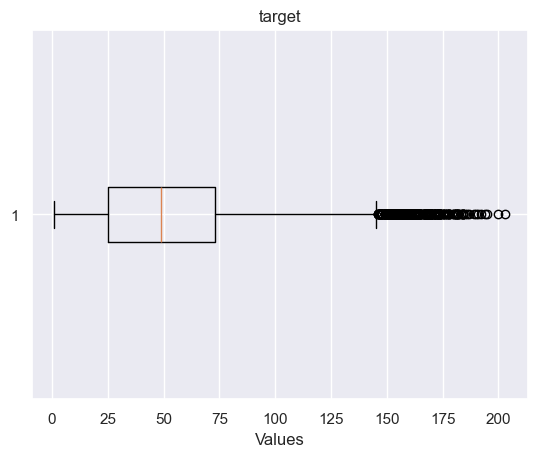

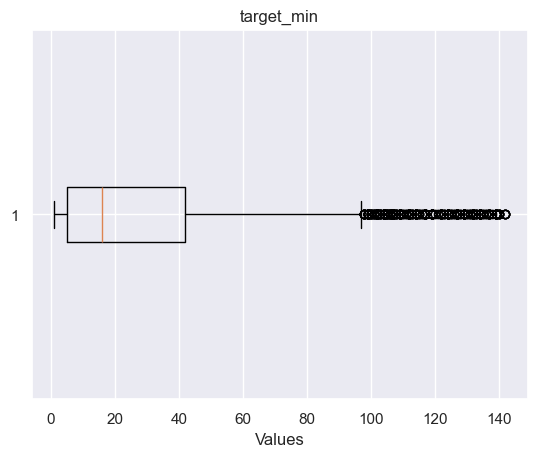

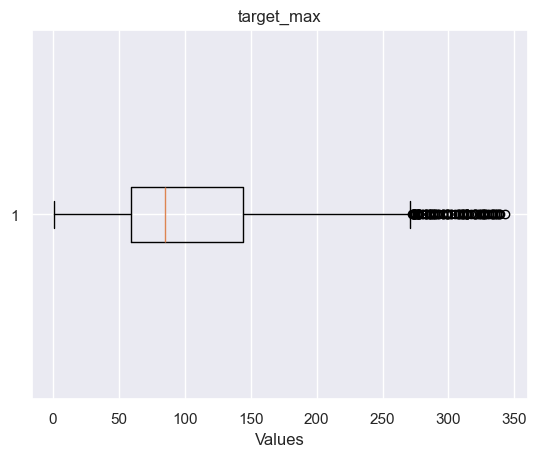

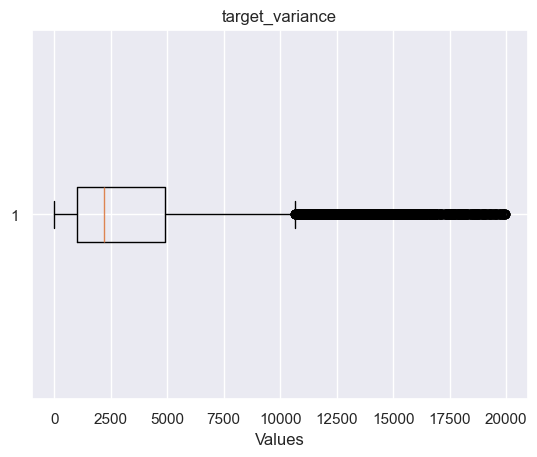

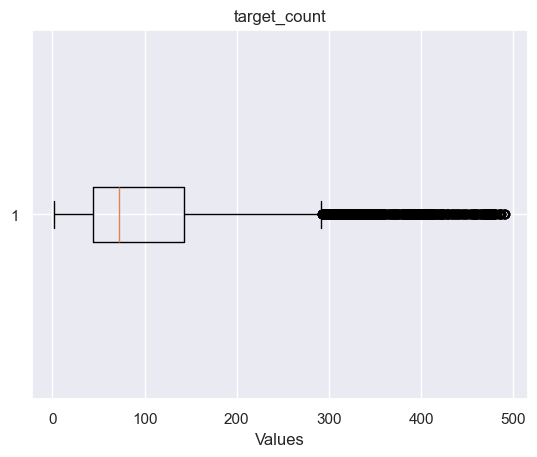

...

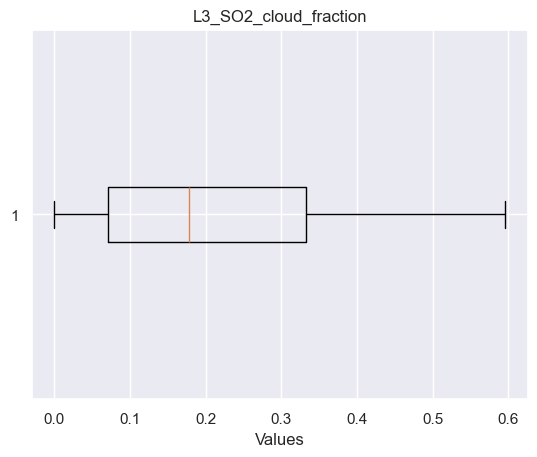

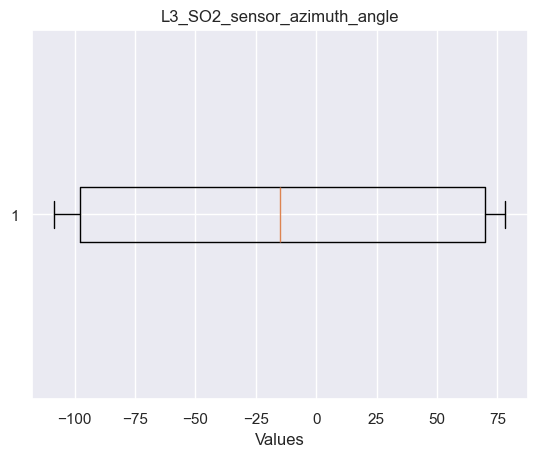

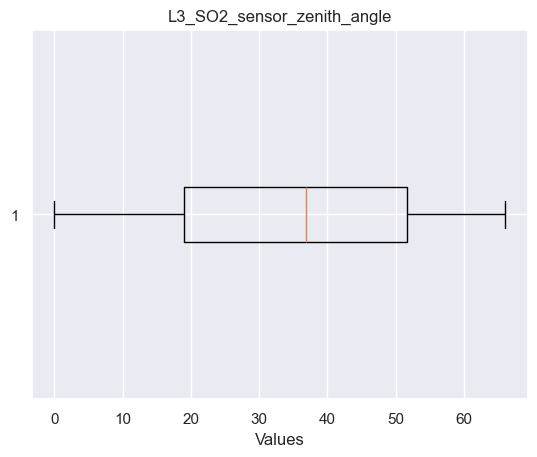

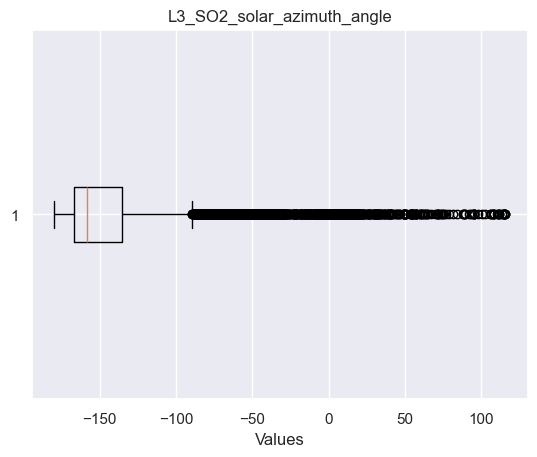

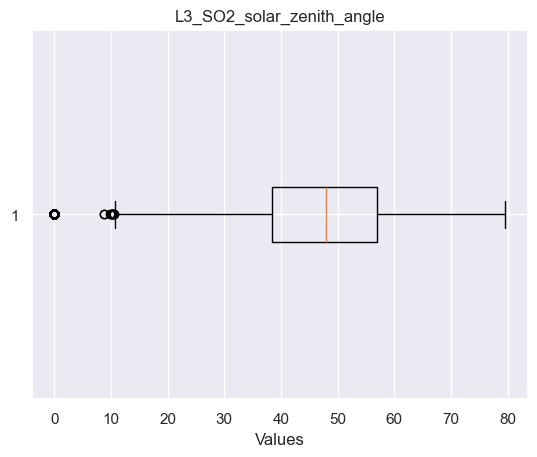

In [58]:
for col in clean_data.select_dtypes(include='number').columns:
    plt.boxplot(clean_data[col], vert= False)
    plt.title(col)
    plt.xlabel('Values')
    plt.show()

The interquartile range (IQR) method proved effective in removing outliers from the dataset. The features now contain values that are more representative of genuine data points and exhibit a more balanced distribution, improving the overall quality of the data.

In [59]:
clean_data.drop(columns= ['Place_ID X Date'], inplace= True)
test_copy.drop(columns= ['Place_ID X Date'], inplace= True)
clean_data.head()

,,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
Date,Place_ID,,,,,,,,,,,,,,,,,,,,,
2020-01-03,010Q650,39.0,25.0,63.0,1319.85,91.0,14.600000,48.799999,0.008390,22.546533,3.330430,...,28.614804,0.000150,0.433957,0.000050,-1.452612,0.059433,-14.708036,59.624912,-67.693509,28.614804
2020-01-04,010Q650,24.0,8.0,56.0,1181.96,96.0,16.400000,33.400002,0.007500,27.031030,5.065727,...,34.296977,0.000150,0.356925,0.000053,-1.572950,0.082063,-105.201338,49.839714,-78.342701,34.296977
2020-01-05,010Q650,49.0,10.0,55.0,1113.67,96.0,6.911948,21.300001,0.003910,23.971857,3.004001,...,30.545393,0.000227,0.584522,0.000110,-1.239317,0.121261,-104.334066,29.181258,-73.896588,30.545446
2020-01-06,010Q650,21.0,9.0,52.0,1164.82,95.0,13.900001,44.700001,0.005350,16.816309,2.621787,...,26.899694,0.000390,0.408047,0.000159,0.202489,0.037919,58.850179,0.797294,-68.612480,26.899694
2020-01-07,010Q650,28.0,10.0,52.0,1053.22,94.0,14.600000,42.200001,0.005862,19.174890,2.955603,...,23.419991,0.000019,0.441191,0.000008,-0.987820,0.063836,76.387658,30.605176,-62.134264,23.419991


In [19]:
clean_data.sort_index(inplace= True)

In [31]:
clean_data.index

MultiIndex([('2020-01-02', '05EC30X'),
            ('2020-01-02', '0DPWHX8'),
            ('2020-01-02', '0TFOCOS'),
            ('2020-01-02', '11WPGRD'),
            ('2020-01-02', '168B2T2'),
            ('2020-01-02', '1GZGJPN'),
            ('2020-01-02', '1PRBF5P'),
            ('2020-01-02', '1SC5AWD'),
            ('2020-01-02', '1SKLTGJ'),
            ('2020-01-02', '1UEYEJQ'),
            ...
            ('2020-03-27', 'XY3IU5C'),
            ('2020-03-27', 'Y14BIVM'),
            ('2020-03-27', 'YAAFH6B'),
            ('2020-03-27', 'YAQHNNY'),
            ('2020-03-27', 'YAXBMZ6'),
            ('2020-03-27', 'YCXA4V5'),
            ('2020-03-27', 'YJENTFL'),
            ('2020-03-27', 'YLLOKEY'),
            ('2020-03-27', 'YLZOBFW'),
            ('2020-03-27', 'YSIXKFZ')],
           names=['Date', 'Place_ID'], length=18468)

# Plotting the weekly PM2.5 reading to see if there's any pattern

<Axes: title={'center': 'DAILY AVERAGE PM2.5 READING'}, xlabel='time', ylabel=' Daily Average PM2.5'>

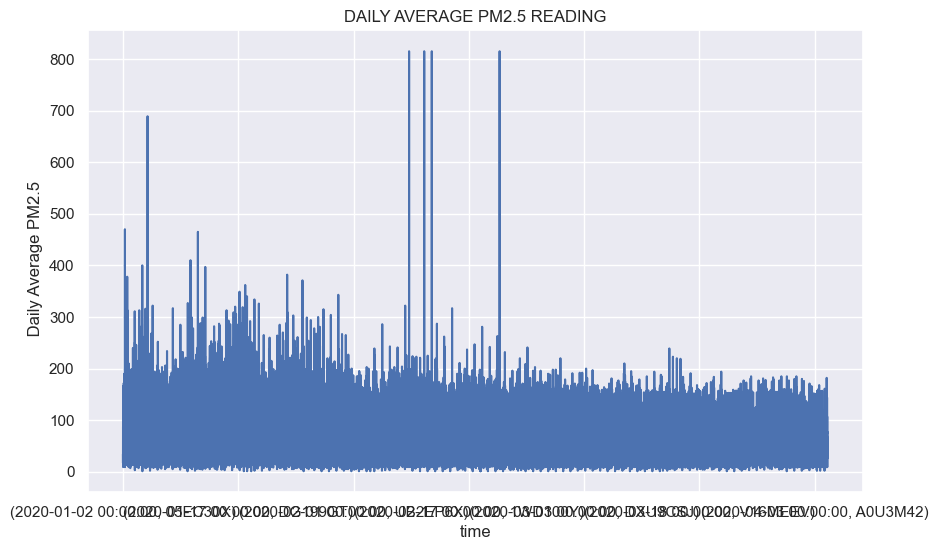

In [20]:
train_data.sort_index(inplace= True)
plt.figure(figsize=(10, 6))
train_data.target.plot(xlabel= 'time', ylabel= ' Daily Average PM2.5', title= 'DAILY AVERAGE PM2.5 READING')

In [21]:
rol_ave= clean_data.copy()
rol_ave.reset_index(drop= True, inplace= True)
rol_ave.sort_index(inplace= True)
rol_ave

,Place_ID X Date,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
0,05EC30X X 2020-01-02,34.0,17.0,95.0,3298.58,23.0,15.837500,61.737501,0.010854,20.518076,...,17.462130,-0.000134,0.588153,-0.000079,-1.744113,0.004035,76.274250,48.799483,-73.607722,17.462130
1,0DPWHX8 X 2020-01-02,73.0,63.0,101.0,846.74,64.0,10.800000,87.700005,0.004550,4.516840,...,66.165863,0.000473,0.365748,0.000164,-1.284855,0.486380,-67.612124,59.194135,-156.851129,67.833932
2,0TFOCOS X 2020-01-02,34.0,13.0,74.0,1450.11,118.0,8.200000,73.400002,0.004050,5.126825,...,63.854531,-0.000316,0.640051,-0.000146,-2.306695,0.445270,-97.988661,34.605686,-159.087388,63.838708
3,11WPGRD X 2020-01-02,74.0,57.0,85.0,622.54,24.0,22.700001,59.100002,0.008170,19.366815,...,53.206200,0.000157,0.472042,0.000055,-2.092233,0.181010,-99.534286,27.350356,-155.692098,53.206200
4,168B2T2 X 2020-01-02,76.0,13.0,153.0,7751.37,96.0,31.900000,77.099998,0.013650,23.206842,...,41.145168,0.000077,0.646589,0.000048,-2.127689,0.112621,-102.862558,2.750090,-151.752685,41.145088
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18463,YCXA4V5 X 2020-03-27,55.0,19.0,72.0,2340.91,72.0,25.500000,66.500000,0.014210,26.291864,...,30.507426,-0.000052,0.952671,-0.000051,-2.917488,0.064391,69.445396,40.948841,-162.204580,30.507426
18464,YJENTFL X 2020-03-27,46.0,17.0,85.0,3374.10,37.0,9.300000,80.700005,0.004060,0.831842,...,38.874006,0.000037,0.725102,-0.000010,-1.985185,0.321001,-15.395636,59.357439,-159.260163,37.869237
18465,YLLOKEY X 2020-03-27,89.0,72.0,106.0,720.80,70.0,4.233333,89.466670,0.003377,0.068506,...,51.291063,0.000243,0.248457,0.000062,-2.099874,0.040642,-16.205668,50.193873,12.860019,51.291063
18466,YLZOBFW X 2020-03-27,15.0,2.0,53.0,1498.14,78.0,7.100000,60.799999,0.003560,4.211847,...,49.026877,0.000106,0.464355,0.000025,-2.186185,0.155914,-104.876494,7.407369,-164.555136,49.034948


In [22]:
rol_ave['Date']= train.Date
rol_ave= rol_ave.set_index(['Date'])


In [23]:
rol_ave.sort_index(inplace=True)

In [24]:
rol_ave.head()

,Place_ID X Date,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,05EC30X X 2020-01-02,34.0,17.0,95.0,3298.58,23.0,15.837500,61.737501,0.010854,20.518076,...,17.462130,-0.000134,0.588153,-0.000079,-1.744113,0.004035,76.274250,48.799483,-73.607722,17.462130
2020-01-02,6KHIOQ8 X 2020-03-03,95.0,77.0,114.0,908.69,42.0,9.506592,50.000000,0.004270,11.541467,...,48.199128,-0.000028,0.378945,0.000002,-1.943974,0.016440,-103.850759,4.536921,-162.932379,48.199786
2020-01-02,I5RGE5G X 2020-03-03,42.0,9.0,75.0,3226.84,65.0,17.294093,55.450001,0.004714,11.787710,...,48.107064,-0.000509,0.107259,-0.000054,-2.881267,0.496186,74.847166,4.737803,-164.964693,48.123401
2020-01-02,YLLOKEY X 2020-03-03,28.0,8.0,73.0,2200.00,25.0,8.139925,90.000003,0.003910,1.604791,...,59.399834,-0.000019,0.654129,-0.000025,-3.378131,0.497688,-106.654156,2.134278,-170.309917,59.437164
2020-01-02,QJXIO6H X 2020-01-09,158.0,70.0,223.0,17904.20,24.0,24.600000,51.600002,0.008508,22.146600,...,39.539428,-0.000409,0.395236,-0.000165,-1.237291,0.170137,68.176072,62.554563,-170.162772,39.539428


The plot for Daily Average PM2.5 is clustered and does not provide any meaningful trend or insight. A rolling average will be implemented to sgow the weekly average PM2.5

# Extracting the weekly average PM2.5 reading using the rolling window average

In [25]:
rol_ave.index= pd.to_datetime(rol_ave.index)

In [26]:
rolling_average = rol_ave.select_dtypes('number').rolling(window='7D', min_periods=1).mean()
rolling_average.head()

,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,34.00,17.000000,95.000000,3298.580000,23.000000,15.837500,61.737501,0.010854,20.518076,2.775127,...,17.462130,-0.000134,0.588153,-0.000079,-1.744113,0.004035,76.274250,48.799483,-73.607722,17.462130
2020-01-02,64.50,47.000000,104.500000,2103.635000,32.500000,12.672046,55.868750,0.007562,16.029771,1.270795,...,32.830629,-0.000081,0.483549,-0.000038,-1.844044,0.010238,-13.788254,26.668202,-118.270050,32.830958
2020-01-02,57.00,34.333333,94.666667,2478.036667,43.333333,14.212728,55.729167,0.006612,14.615751,1.527267,...,37.922774,-0.000223,0.358119,-0.000044,-2.189785,0.172220,15.756886,19.358069,-133.834931,37.928439
2020-01-02,49.75,27.750000,89.250000,2408.527500,38.750000,12.694527,64.296876,0.005937,11.363011,1.939566,...,43.292039,-0.000172,0.432121,-0.000039,-2.486871,0.253587,-14.845875,15.052121,-142.953678,43.305620
2020-01-02,71.40,36.200000,116.000000,5507.662000,35.800000,15.075622,61.757501,0.006451,13.519729,1.675190,...,42.541517,-0.000220,0.424744,-0.000064,-2.236955,0.236897,1.758515,24.552610,-148.395496,42.552382


<Axes: title={'center': 'Smooth PM2.5 Reading'}, xlabel='time', ylabel='Weekly Average PM2.5'>

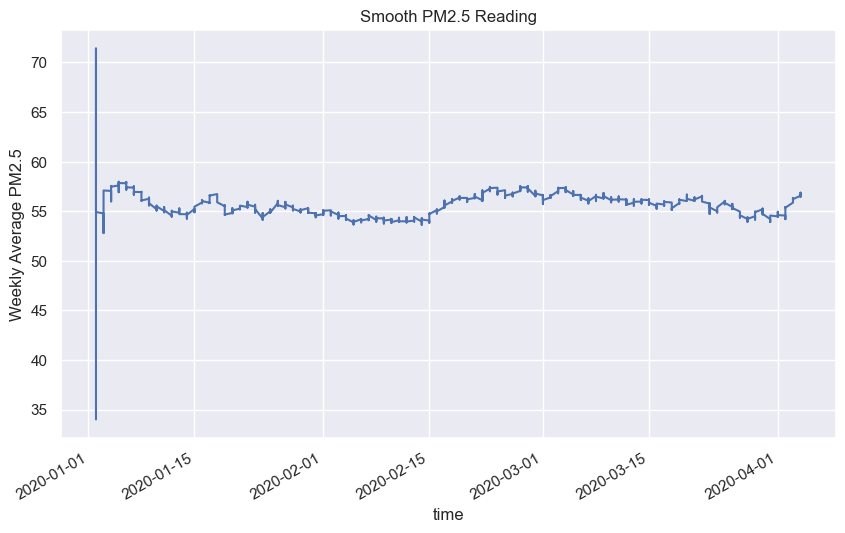

In [27]:
plt.figure(figsize=(10, 6))
rolling_average.target.plot(xlabel= 'time', ylabel= 'Weekly Average PM2.5', title= 'Smooth PM2.5 Reading')

<Axes: xlabel='time', ylabel='Maximum Daily PM2.5'>

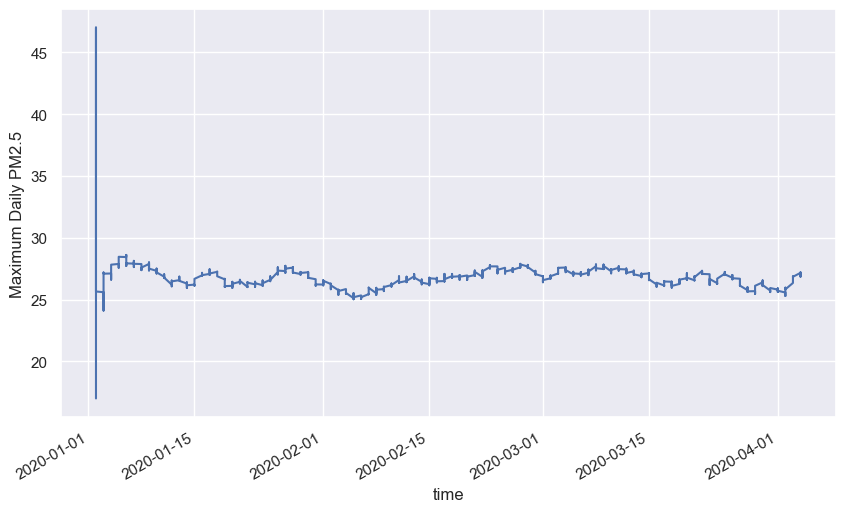

In [28]:
plt.figure(figsize=(10, 6))
rolling_average.target_min.plot(xlabel= 'time', ylabel= 'Maximum Daily PM2.5')

<Axes: xlabel='time', ylabel='Maximum Daily PM2.5'>

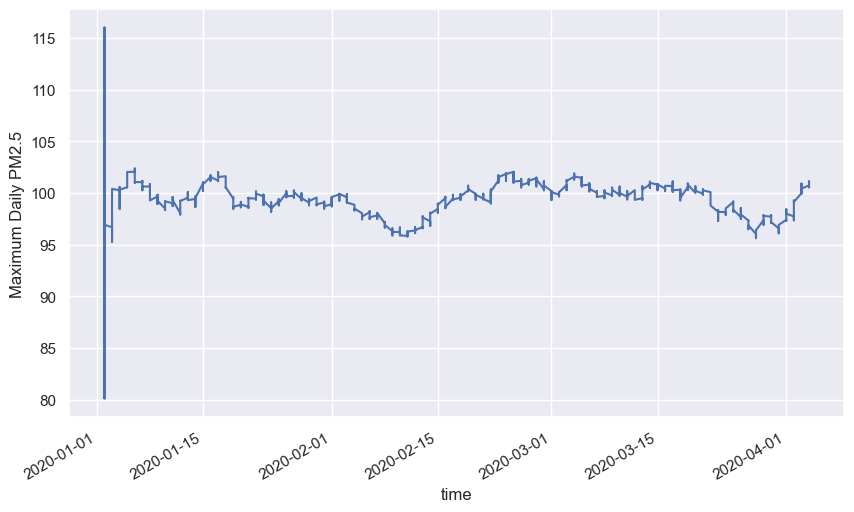

In [29]:
plt.figure(figsize=(10, 6))
rolling_average.target_max.plot(xlabel= 'time', ylabel= 'Maximum Daily PM2.5')

<Axes: xlabel='time', ylabel='Daily Variance PM2.5'>

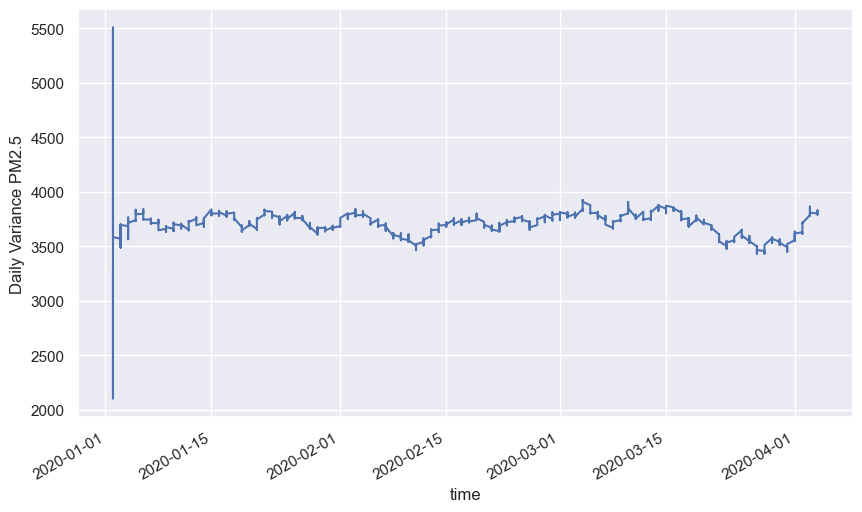

In [30]:
plt.figure(figsize=(10, 6))
rolling_average.target_variance.plot(xlabel= 'time', ylabel= 'Daily Variance PM2.5')

The plots suggests a generally decreasing trend in the maximum daily PM2.5 concentration from January to April. There are fluctuations, but the overall direction is downwards.

This could potentially be linked to the early stages of the COVID-19 pandemic and the measures taken to curb its spread. Here's why:

Lockdowns and Reduced Activity: Many countries in Africa, like the rest of the world, implemented lockdowns and restrictions on movement in early 2020 to combat the spread of COVID-19. These measures led to a significant decrease in industrial activity, transportation, and other human activities that contribute to air pollution, including PM2.5 emissions.   

Reduced Traffic: With lockdowns in place, there was a dramatic reduction in the number of vehicles on the roads. Traffic is a major source of PM2.5 pollution in urban areas, so this decrease in traffic likely contributed to lower PM2.5 levels.   

Industrial Slowdown: Many industries were forced to scale down or temporarily halt operations during lockdowns. This reduction in industrial activity would have resulted in lower emissions of pollutants, including PM2.5.

Seasonal Factors: While the COVID-19 lockdowns are a strong potential factor, it's important to consider that there might be seasonal factors at play as well. Some regions in Africa might experience changes in weather patterns or agricultural practices during these months that could influence PM2.5 levels. However, given the widespread lockdowns, the pandemic's impact is likely a more significant factor.

In [31]:
clean_data.head()

Place_ID X Date  target  target_min  target_max  \
Date       Place_ID                                                         
2020-01-02 05EC30X   05EC30X X 2020-01-02    34.0        17.0        95.0   
           0DPWHX8   0DPWHX8 X 2020-01-02    73.0        63.0       101.0   
           0TFOCOS   0TFOCOS X 2020-01-02    34.0        13.0        74.0   
           11WPGRD   11WPGRD X 2020-01-02    74.0        57.0        85.0   
           168B2T2   168B2T2 X 2020-01-02    76.0        13.0       153.0   

                     target_variance  target_count  \
Date       Place_ID                                  
2020-01-02 05EC30X           3298.58          23.0   
           0DPWHX8            846.74          64.0   
           0TFOCOS           1450.11         118.0   
           11WPGRD            622.54          24.0   
           168B2T2           7751.37          96.0   

                     precipitable_water_entire_atmosphere  \
Date       Place_ID                                         
2020-01-02 05EC30X                              15.837500   
           0DPWHX8                              10.800000   
           0TFOCOS                               8.200000   
           11WPGRD                              22.700001   
           168B2T2                              31.900000   

                     relative_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                           61.737501   
           0DPWHX8                           87.700005   
           0TFOCOS                           73.400002   
           11WPGRD                           59.100002   
           168B2T2                           77.099998   

                     specific_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                            0.010854   
           0DPWHX8                            0.004550   
           0TFOCOS                            0.004050   
           11WPGRD                            0.008170   
           168B2T2                            0.013650   

                     temperature_2m_above_ground  ...  \
Date       Place_ID                               ...   
2020-01-02 05EC30X                     20.518076  ...   
           0DPWHX8                      4.516840  ...   
           0TFOCOS                      5.126825  ...   
           11WPGRD                     19.366815  ...   
           168B2T2                     23.206842  ...   

                     L3_AER_AI_solar_zenith_angle  \
Date       Place_ID                                 
2020-01-02 05EC30X                      17.462130   
           0DPWHX8                      66.165863   
           0TFOCOS                      63.854531   
           11WPGRD                      53.206200   
           168B2T2                      41.145168   

                     L3_SO2_SO2_column_number_density  \
Date       Place_ID                                     
2020-01-02 05EC30X                          -0.000134   
           0DPWHX8                           0.000473   
           0TFOCOS                          -0.000316   
           11WPGRD                           0.000157   
           168B2T2                           0.000077   

                     L3_SO2_SO2_column_number_density_amf  \
Date       Place_ID                                         
2020-01-02 05EC30X                               0.588153   
           0DPWHX8                               0.365748   
           0TFOCOS                               0.640051   
           11WPGRD                               0.472042   
           168B2T2                               0.646589   

                     L3_SO2_SO2_slant_column_number_density  \
Date       Place_ID                                           
2020-01-02 05EC30X                                -0.000079   
           0DPWHX8                                 0.000164   
           0T

# Checking for features with Multicolinearity (high correlations)

Features that are highly correlated will be redundant for the prediction as they hold similar similar information and using 2 or more features that are highly correlated does not add much predictive power to the model

In [32]:
clean_data.head()

Place_ID X Date  target  target_min  target_max  \
Date       Place_ID                                                         
2020-01-02 05EC30X   05EC30X X 2020-01-02    34.0        17.0        95.0   
           0DPWHX8   0DPWHX8 X 2020-01-02    73.0        63.0       101.0   
           0TFOCOS   0TFOCOS X 2020-01-02    34.0        13.0        74.0   
           11WPGRD   11WPGRD X 2020-01-02    74.0        57.0        85.0   
           168B2T2   168B2T2 X 2020-01-02    76.0        13.0       153.0   

                     target_variance  target_count  \
Date       Place_ID                                  
2020-01-02 05EC30X           3298.58          23.0   
           0DPWHX8            846.74          64.0   
           0TFOCOS           1450.11         118.0   
           11WPGRD            622.54          24.0   
           168B2T2           7751.37          96.0   

                     precipitable_water_entire_atmosphere  \
Date       Place_ID                                         
2020-01-02 05EC30X                              15.837500   
           0DPWHX8                              10.800000   
           0TFOCOS                               8.200000   
           11WPGRD                              22.700001   
           168B2T2                              31.900000   

                     relative_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                           61.737501   
           0DPWHX8                           87.700005   
           0TFOCOS                           73.400002   
           11WPGRD                           59.100002   
           168B2T2                           77.099998   

                     specific_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                            0.010854   
           0DPWHX8                            0.004550   
           0TFOCOS                            0.004050   
           11WPGRD                            0.008170   
           168B2T2                            0.013650   

                     temperature_2m_above_ground  ...  \
Date       Place_ID                               ...   
2020-01-02 05EC30X                     20.518076  ...   
           0DPWHX8                      4.516840  ...   
           0TFOCOS                      5.126825  ...   
           11WPGRD                     19.366815  ...   
           168B2T2                     23.206842  ...   

                     L3_AER_AI_solar_zenith_angle  \
Date       Place_ID                                 
2020-01-02 05EC30X                      17.462130   
           0DPWHX8                      66.165863   
           0TFOCOS                      63.854531   
           11WPGRD                      53.206200   
           168B2T2                      41.145168   

                     L3_SO2_SO2_column_number_density  \
Date       Place_ID                                     
2020-01-02 05EC30X                          -0.000134   
           0DPWHX8                           0.000473   
           0TFOCOS                          -0.000316   
           11WPGRD                           0.000157   
           168B2T2                           0.000077   

                     L3_SO2_SO2_column_number_density_amf  \
Date       Place_ID                                         
2020-01-02 05EC30X                               0.588153   
           0DPWHX8                               0.365748   
           0TFOCOS                               0.640051   
           11WPGRD                               0.472042   
           168B2T2                               0.646589   

                     L3_SO2_SO2_slant_column_number_density  \
Date       Place_ID                                           
2020-01-02 05EC30X                                -0.000079   
           0DPWHX8                                 0.000164   
           0T

In [44]:
clean_data.corr()

,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
target,1.000000,0.837576,0.816189,0.527174,0.043996,0.025284,-0.030068,0.047411,0.030371,-0.171064,...,-0.134050,0.001390,-0.001191,0.019242,0.107775,-0.081222,0.013441,0.029446,-0.155042,-0.121060
target_min,0.837576,1.000000,0.569041,0.197460,-0.130369,0.022744,0.013159,0.046052,0.026813,-0.142489,...,-0.092289,0.001872,-0.011201,0.012866,0.096344,-0.064290,0.010989,0.019724,-0.100179,-0.080457
target_max,0.816189,0.569041,1.000000,0.780352,0.178948,-0.000859,-0.080857,0.023287,0.016333,-0.148823,...,-0.135650,0.001891,0.017085,0.021676,0.090765,-0.079514,0.011415,0.032511,-0.161129,-0.119159
target_variance,0.527174,0.197460,0.780352,1.000000,0.042278,-0.006815,-0.059750,0.007456,-0.007728,-0.084512,...,-0.088545,0.001068,0.017454,0.013833,0.058853,-0.054085,0.006726,0.027771,-0.109885,-0.076700
target_count,0.043996,-0.130369,0.178948,0.042278,1.000000,-0.107093,-0.091464,-0.139723,-0.091270,0.010120,...,0.028221,-0.003917,-0.009968,0.003016,-0.006297,-0.000774,-0.001768,-0.006169,-0.064541,0.030365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L3_SO2_cloud_fraction,-0.081222,-0.064290,-0.079514,-0.054085,-0.000774,0.061592,0.307184,-0.023959,-0.174286,0.057808,...,0.229136,-0.052939,0.188373,-0.066683,-0.119325,1.000000,-0.118535,0.189772,-0.031649,0.290899
L3_SO2_sensor_azimuth_angle,0.013441,0.010989,0.011415,0.006726,-0.001768,0.015833,-0.002537,0.010723,0.010608,-0.020678,...,-0.110573,0.000736,0.000972,0.013407,-0.222023,-0.118535,1.000000,-0.046755,-0.091772,-0.139408
L3_SO2_sensor_zenith_angle,0.029446,0.019724,0.032511,0.027771,-0.006169,0.069992,-0.046046,0.090168,0.096372,-0.034665,...,-0.114081,0.018342,-0.023826,-0.002462,0.446530,0.189772,-0.046755,1.000000,0.254414,-0.020759
L3_SO2_solar_azimuth_angle,-0.155042,-0.100179,-0.161129,-0.109885,-0.064541,0.046230,0.003469,0.057842,0.063547,0.051135,...,-0.071586,0.019211,-0.053380,0.011232,0.297557,-0.031649,-0.091772,0.254414,1.000000,-0.173448


In [45]:
clean_data.columns

Index(['target', 'target_min', 'target_max', 'target_variance', 'target_count',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground',
       'L3_NO2_NO2_column_number_density',
       'L3_NO2_NO2_slant_column_number_density',
       'L3_NO2_absorbing_aerosol_index', 'L3_NO2_cloud_fraction',
       'L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle',
       'L3_NO2_sensor_zenith_angle', 'L3_NO2_solar_azimuth_angle',
       'L3_NO2_solar_zenith_angle',
       'L3_NO2_stratospheric_NO2_column_number_density',
       'L3_NO2_tropopause_pressure',
       'L3_NO2_tropospheric_NO2_column_number_density',
       'L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature',
       'L3_O3_cloud_fraction', 'L3_O3_sensor_azimuth_angle',
       'L3_O3_sensor_zenith_angle', 'L3_O3_solar_

Since there are to many features in the dataset, it will be difficult to read the correlation table/matrix. The features will be grouped based on similarity and the correlation between features in each group will be explored

# Basic Meteorological Variables

In [46]:
meteor_var= clean_data[['precipitable_water_entire_atmosphere',
                        'relative_humidity_2m_above_ground',
                        'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
                        'u_component_of_wind_10m_above_ground',
                        'v_component_of_wind_10m_above_ground']]

meteor_var.corr()

,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground
precipitable_water_entire_atmosphere,1.000000,0.248448,0.871245,0.733056,-0.223369,0.082834
relative_humidity_2m_above_ground,0.248448,1.000000,0.287554,-0.206492,-0.011940,0.087974
specific_humidity_2m_above_ground,0.871245,0.287554,1.000000,0.811327,-0.231021,0.066100
temperature_2m_above_ground,0.733056,-0.206492,0.811327,1.000000,-0.174796,0.046959
u_component_of_wind_10m_above_ground,-0.223369,-0.011940,-0.231021,-0.174796,1.000000,0.099346
v_component_of_wind_10m_above_ground,0.082834,0.087974,0.066100,0.046959,0.099346,1.000000


In [47]:
met_corr= ['specific_humidity_2m_above_ground', 'temperature_2m_above_ground', 'precipitable_water_entire_atmosphere', 'v_component_of_wind_10m_above_ground']

for col in met_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)


column name: specific_humidity_2m_above_ground   Target Correlation: 0.04741073559559018
column name: temperature_2m_above_ground   Target Correlation: 0.030371389456971334
column name: precipitable_water_entire_atmosphere   Target Correlation: 0.025283856763816653
column name: v_component_of_wind_10m_above_ground   Target Correlation: -0.04443957080243559


#  Nitrogen Dioxide (NO2) Satellite Measurements (L3)

In [48]:
l3_no2= clean_data[['L3_NO2_NO2_column_number_density',
                   'L3_NO2_NO2_slant_column_number_density',
                   'L3_NO2_absorbing_aerosol_index', 'L3_NO2_cloud_fraction',
                   'L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle',
                   'L3_NO2_sensor_zenith_angle', 'L3_NO2_solar_azimuth_angle',
                   'L3_NO2_solar_zenith_angle',
                   'L3_NO2_stratospheric_NO2_column_number_density',
                   'L3_NO2_tropopause_pressure',
                   'L3_NO2_tropospheric_NO2_column_number_density']]

l3_no2.corr()

,L3_NO2_NO2_column_number_density,L3_NO2_NO2_slant_column_number_density,L3_NO2_absorbing_aerosol_index,L3_NO2_cloud_fraction,L3_NO2_sensor_altitude,L3_NO2_sensor_azimuth_angle,L3_NO2_sensor_zenith_angle,L3_NO2_solar_azimuth_angle,L3_NO2_solar_zenith_angle,L3_NO2_stratospheric_NO2_column_number_density,L3_NO2_tropopause_pressure,L3_NO2_tropospheric_NO2_column_number_density
L3_NO2_NO2_column_number_density,1.000000,0.705181,0.014784,-0.116130,-0.062191,0.006531,-0.056685,-0.101096,0.067352,0.070130,0.065352,0.803953
L3_NO2_NO2_slant_column_number_density,0.705181,1.000000,0.158235,-0.301054,0.067391,-0.011819,0.225668,0.077161,0.128529,0.234542,0.176186,0.639744
L3_NO2_absorbing_aerosol_index,0.014784,0.158235,1.000000,0.296874,0.090428,-0.252768,0.346584,0.231639,0.035306,0.098719,-0.033194,0.022960
L3_NO2_cloud_fraction,-0.116130,-0.301054,0.296874,1.000000,0.015783,0.004733,0.037156,0.008798,0.158900,-0.197741,0.167178,-0.098234
L3_NO2_sensor_altitude,-0.062191,0.067391,0.090428,0.015783,1.000000,0.014685,-0.020659,0.504611,0.119310,0.406011,0.206845,-0.163844
L3_NO2_sensor_azimuth_angle,0.006531,-0.011819,-0.252768,0.004733,0.014685,1.000000,-0.004481,-0.102974,-0.108716,-0.067047,0.009178,0.012023
L3_NO2_sensor_zenith_angle,-0.056685,0.225668,0.346584,0.037156,-0.020659,-0.004481,1.000000,0.335032,-0.045295,0.016177,-0.064607,-0.049794
L3_NO2_solar_azimuth_angle,-0.101096,0.077161,0.231639,0.008798,0.504611,-0.102974,0.335032,1.000000,0.017522,0.172638,0.067746,-0.142187
L3_NO2_solar_zenith_angle,0.067352,0.128529,0.035306,0.158900,0.119310,-0.108716,-0.045295,0.017522,1.000000,-0.499333,0.609086,0.142410
L3_NO2_stratospheric_NO2_column_number_density,0.070130,0.234542,0.098719,-0.197741,0.406011,-0.067047,0.016177,0.172638,-0.499333,1.000000,-0.002936,-0.092297


In [49]:
nit_corr= ['L3_NO2_NO2_column_number_density', 'L3_NO2_NO2_slant_column_number_density', 'L3_NO2_tropospheric_NO2_column_number_density',
'L3_NO2_solar_zenith_angle', 'L3_NO2_tropopause_pressure']

for col in nit_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_NO2_NO2_column_number_density   Target Correlation: 0.250677404041778
column name: L3_NO2_NO2_slant_column_number_density   Target Correlation: 0.24319893813337315
column name: L3_NO2_tropospheric_NO2_column_number_density   Target Correlation: 0.263251082717348
column name: L3_NO2_solar_zenith_angle   Target Correlation: -0.13388302813787656
column name: L3_NO2_tropopause_pressure   Target Correlation: -0.22688606293156396


# Ozone (O3) Satellite Measurements (L3)

In [50]:
l3_o3= clean_data[['L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature',
       'L3_O3_cloud_fraction', 'L3_O3_sensor_azimuth_angle',
       'L3_O3_sensor_zenith_angle', 'L3_O3_solar_azimuth_angle',
       'L3_O3_solar_zenith_angle']]

l3_o3.corr()

,L3_O3_O3_column_number_density,L3_O3_O3_effective_temperature,L3_O3_cloud_fraction,L3_O3_sensor_azimuth_angle,L3_O3_sensor_zenith_angle,L3_O3_solar_azimuth_angle,L3_O3_solar_zenith_angle
L3_O3_O3_column_number_density,1.000000,-0.415747,0.138537,0.010986,-0.054182,0.120173,0.539053
L3_O3_O3_effective_temperature,-0.415747,1.000000,-0.172357,0.002555,0.041988,-0.049161,-0.745952
L3_O3_cloud_fraction,0.138537,-0.172357,1.000000,0.005801,0.059634,0.046152,0.234079
L3_O3_sensor_azimuth_angle,0.010986,0.002555,0.005801,1.000000,-0.007795,-0.110364,-0.105314
L3_O3_sensor_zenith_angle,-0.054182,0.041988,0.059634,-0.007795,1.000000,0.344834,-0.024851
L3_O3_solar_azimuth_angle,0.120173,-0.049161,0.046152,-0.110364,0.344834,1.000000,0.063232
L3_O3_solar_zenith_angle,0.539053,-0.745952,0.234079,-0.105314,-0.024851,0.063232,1.000000


In [51]:
ozone_corr= ['L3_O3_solar_zenith_angle', 'L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature']

for col in ozone_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_O3_solar_zenith_angle   Target Correlation: -0.13391586182797002
column name: L3_O3_O3_column_number_density   Target Correlation: -0.19736472257357102
column name: L3_O3_O3_effective_temperature   Target Correlation: 0.13710875441642809


# Carbon Monoxide (CO) Satellite Measurements (L3)

In [52]:
l3_co= clean_data[['L3_CO_CO_column_number_density',
       'L3_CO_H2O_column_number_density', 'L3_CO_cloud_height',
       'L3_CO_sensor_altitude', 'L3_CO_sensor_azimuth_angle',
       'L3_CO_sensor_zenith_angle', 'L3_CO_solar_azimuth_angle',
       'L3_CO_solar_zenith_angle']]

l3_co.corr()

,L3_CO_CO_column_number_density,L3_CO_H2O_column_number_density,L3_CO_cloud_height,L3_CO_sensor_altitude,L3_CO_sensor_azimuth_angle,L3_CO_sensor_zenith_angle,L3_CO_solar_azimuth_angle,L3_CO_solar_zenith_angle
L3_CO_CO_column_number_density,1.000000,0.037269,-0.060787,-0.426497,0.008168,0.007413,-0.229020,0.041341
L3_CO_H2O_column_number_density,0.037269,1.000000,0.159755,-0.078160,0.015508,0.041319,0.080678,-0.555860
L3_CO_cloud_height,-0.060787,0.159755,1.000000,-0.014388,-0.010981,-0.076447,-0.087602,0.025151
L3_CO_sensor_altitude,-0.426497,-0.078160,-0.014388,1.000000,-0.004878,-0.031815,0.513800,0.122054
L3_CO_sensor_azimuth_angle,0.008168,0.015508,-0.010981,-0.004878,1.000000,-0.019673,-0.098186,-0.150542
L3_CO_sensor_zenith_angle,0.007413,0.041319,-0.076447,-0.031815,-0.019673,1.000000,0.280120,-0.056778
L3_CO_solar_azimuth_angle,-0.229020,0.080678,-0.087602,0.513800,-0.098186,0.280120,1.000000,-0.064616
L3_CO_solar_zenith_angle,0.041341,-0.555860,0.025151,0.122054,-0.150542,-0.056778,-0.064616,1.000000


# Formaldehyde (HCHO) Satellite Measurements (L3)

In [53]:
l3_hcho= clean_data[['L3_HCHO_HCHO_slant_column_number_density',
       'L3_HCHO_cloud_fraction', 'L3_HCHO_sensor_azimuth_angle',
       'L3_HCHO_sensor_zenith_angle', 'L3_HCHO_solar_azimuth_angle',
       'L3_HCHO_solar_zenith_angle',
       'L3_HCHO_tropospheric_HCHO_column_number_density',
       'L3_HCHO_tropospheric_HCHO_column_number_density_amf']]

l3_hcho.corr()

,L3_HCHO_HCHO_slant_column_number_density,L3_HCHO_cloud_fraction,L3_HCHO_sensor_azimuth_angle,L3_HCHO_sensor_zenith_angle,L3_HCHO_solar_azimuth_angle,L3_HCHO_solar_zenith_angle,L3_HCHO_tropospheric_HCHO_column_number_density,L3_HCHO_tropospheric_HCHO_column_number_density_amf
L3_HCHO_HCHO_slant_column_number_density,1.000000,-0.205768,0.169499,0.047311,-0.024124,-0.315470,0.901305,-0.069310
L3_HCHO_cloud_fraction,-0.205768,1.000000,-0.142607,0.230226,-0.007636,0.318929,-0.275664,0.350043
L3_HCHO_sensor_azimuth_angle,0.169499,-0.142607,1.000000,-0.050770,-0.082960,-0.156089,0.193688,-0.006598
L3_HCHO_sensor_zenith_angle,0.047311,0.230226,-0.050770,1.000000,0.272606,-0.016626,0.047917,0.076756
L3_HCHO_solar_azimuth_angle,-0.024124,-0.007636,-0.082960,0.272606,1.000000,-0.130284,-0.015660,-0.090732
L3_HCHO_solar_zenith_angle,-0.315470,0.318929,-0.156089,-0.016626,-0.130284,1.000000,-0.429518,0.105402
L3_HCHO_tropospheric_HCHO_column_number_density,0.901305,-0.275664,0.193688,0.047917,-0.015660,-0.429518,1.000000,-0.286562
L3_HCHO_tropospheric_HCHO_column_number_density_amf,-0.069310,0.350043,-0.006598,0.076756,-0.090732,0.105402,-0.286562,1.000000


In [54]:
hcho_corr = ['L3_HCHO_HCHO_slant_column_number_density', 'L3_HCHO_tropospheric_HCHO_column_number_density']

for col in hcho_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_HCHO_HCHO_slant_column_number_density   Target Correlation: 0.3457329537052294
column name: L3_HCHO_tropospheric_HCHO_column_number_density   Target Correlation: 0.3734007710702822


# PM 2.5 Statistical Correlation

In [55]:
target= clean_data[['target', 'target_max', 'target_min', 'target_variance', 'target_count']]

target.corr()

,target,target_max,target_min,target_variance,target_count
target,1.000000,0.816189,0.837576,0.527174,0.043996
target_max,0.816189,1.000000,0.569041,0.780352,0.178948
target_min,0.837576,0.569041,1.000000,0.197460,-0.130369
target_variance,0.527174,0.780352,0.197460,1.000000,0.042278
target_count,0.043996,0.178948,-0.130369,0.042278,1.000000


# Cloud Properties (L3)

In [56]:
l3_cloud= clean_data[['L3_CLOUD_cloud_base_height', 'L3_CLOUD_cloud_base_pressure',
       'L3_CLOUD_cloud_fraction', 'L3_CLOUD_cloud_optical_depth',
       'L3_CLOUD_cloud_top_height', 'L3_CLOUD_cloud_top_pressure',
       'L3_CLOUD_sensor_azimuth_angle', 'L3_CLOUD_sensor_zenith_angle',
       'L3_CLOUD_solar_azimuth_angle', 'L3_CLOUD_solar_zenith_angle',
       'L3_CLOUD_surface_albedo']]

l3_cloud.corr()

,L3_CLOUD_cloud_base_height,L3_CLOUD_cloud_base_pressure,L3_CLOUD_cloud_fraction,L3_CLOUD_cloud_optical_depth,L3_CLOUD_cloud_top_height,L3_CLOUD_cloud_top_pressure,L3_CLOUD_sensor_azimuth_angle,L3_CLOUD_sensor_zenith_angle,L3_CLOUD_solar_azimuth_angle,L3_CLOUD_solar_zenith_angle,L3_CLOUD_surface_albedo
L3_CLOUD_cloud_base_height,1.000000,-0.990319,0.110505,0.089696,0.992190,-0.970279,0.107660,-0.053223,-0.025145,-0.020474,0.082672
L3_CLOUD_cloud_base_pressure,-0.990319,1.000000,-0.129629,-0.111751,-0.987365,0.986108,-0.117996,0.064249,0.027070,0.014584,-0.088434
L3_CLOUD_cloud_fraction,0.110505,-0.129629,1.000000,0.751918,0.152091,-0.184614,0.003809,0.060320,0.043689,0.233316,0.134352
L3_CLOUD_cloud_optical_depth,0.089696,-0.111751,0.751918,1.000000,0.124437,-0.157215,-0.011013,-0.028406,-0.067673,0.143961,0.107745
L3_CLOUD_cloud_top_height,0.992190,-0.987365,0.152091,0.124437,1.000000,-0.987942,0.127859,-0.067079,-0.032083,-0.003658,0.068332
L3_CLOUD_cloud_top_pressure,-0.970279,0.986108,-0.184614,-0.157215,-0.987942,1.000000,-0.142861,0.081845,0.036421,-0.011482,-0.069411
L3_CLOUD_sensor_azimuth_angle,0.107660,-0.117996,0.003809,-0.011013,0.127859,-0.142861,1.000000,-0.007252,-0.107218,-0.104544,-0.066041
L3_CLOUD_sensor_zenith_angle,-0.053223,0.064249,0.060320,-0.028406,-0.067079,0.081845,-0.007252,1.000000,0.345926,-0.023154,-0.034092
L3_CLOUD_solar_azimuth_angle,-0.025145,0.027070,0.043689,-0.067673,-0.032083,0.036421,-0.107218,0.345926,1.000000,0.066076,0.098528
L3_CLOUD_solar_zenith_angle,-0.020474,0.014584,0.233316,0.143961,-0.003658,-0.011482,-0.104544,-0.023154,0.066076,1.000000,0.093327


In [57]:
cloud_corr= ['L3_CLOUD_cloud_base_height', 'L3_CLOUD_cloud_base_pressure','L3_CLOUD_cloud_top_height', 'L3_CLOUD_cloud_top_pressure']

for col in cloud_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_CLOUD_cloud_base_height   Target Correlation: -0.06828967110276042
column name: L3_CLOUD_cloud_base_pressure   Target Correlation: 0.0791233992430687
column name: L3_CLOUD_cloud_top_height   Target Correlation: -0.08574150718807123
column name: L3_CLOUD_cloud_top_pressure   Target Correlation: 0.10400190142265166


# Aerosol Index (L3)

In [58]:
l3_aero= clean_data[['L3_AER_AI_absorbing_aerosol_index',
       'L3_AER_AI_sensor_altitude', 'L3_AER_AI_sensor_azimuth_angle',
       'L3_AER_AI_sensor_zenith_angle', 'L3_AER_AI_solar_azimuth_angle',
       'L3_AER_AI_solar_zenith_angle']]

l3_aero.corr()

,L3_AER_AI_absorbing_aerosol_index,L3_AER_AI_sensor_altitude,L3_AER_AI_sensor_azimuth_angle,L3_AER_AI_sensor_zenith_angle,L3_AER_AI_solar_azimuth_angle,L3_AER_AI_solar_zenith_angle
L3_AER_AI_absorbing_aerosol_index,1.000000,0.100831,-0.244869,0.358288,0.258820,0.075380
L3_AER_AI_sensor_altitude,0.100831,1.000000,0.017310,-0.009432,0.515429,0.123038
L3_AER_AI_sensor_azimuth_angle,-0.244869,0.017310,1.000000,-0.003358,-0.115072,-0.102784
L3_AER_AI_sensor_zenith_angle,0.358288,-0.009432,-0.003358,1.000000,0.351201,-0.022632
L3_AER_AI_solar_azimuth_angle,0.258820,0.515429,-0.115072,0.351201,1.000000,0.072013
L3_AER_AI_solar_zenith_angle,0.075380,0.123038,-0.102784,-0.022632,0.072013,1.000000


# Sulfur Dioxide (SO2) Satellite Measurements (L3)

In [59]:
l3_sulphur= clean_data[['L3_SO2_SO2_column_number_density',
       'L3_SO2_SO2_column_number_density_amf',
       'L3_SO2_SO2_slant_column_number_density',
       'L3_SO2_absorbing_aerosol_index', 'L3_SO2_cloud_fraction',
       'L3_SO2_sensor_azimuth_angle', 'L3_SO2_sensor_zenith_angle',
       'L3_SO2_solar_azimuth_angle', 'L3_SO2_solar_zenith_angle']]

l3_sulphur.corr()

,L3_SO2_SO2_column_number_density,L3_SO2_SO2_column_number_density_amf,L3_SO2_SO2_slant_column_number_density,L3_SO2_absorbing_aerosol_index,L3_SO2_cloud_fraction,L3_SO2_sensor_azimuth_angle,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle
L3_SO2_SO2_column_number_density,1.000000,-0.119043,0.855237,0.037736,-0.052939,0.000736,0.018342,0.019211,0.118593
L3_SO2_SO2_column_number_density_amf,-0.119043,1.000000,-0.061596,-0.224444,0.188373,0.000972,-0.023826,-0.053380,-0.373631
L3_SO2_SO2_slant_column_number_density,0.855237,-0.061596,1.000000,0.023850,-0.066683,0.013407,-0.002462,0.011232,0.075296
L3_SO2_absorbing_aerosol_index,0.037736,-0.224444,0.023850,1.000000,-0.119325,-0.222023,0.446530,0.297557,-0.106237
L3_SO2_cloud_fraction,-0.052939,0.188373,-0.066683,-0.119325,1.000000,-0.118535,0.189772,-0.031649,0.290899
L3_SO2_sensor_azimuth_angle,0.000736,0.000972,0.013407,-0.222023,-0.118535,1.000000,-0.046755,-0.091772,-0.139408
L3_SO2_sensor_zenith_angle,0.018342,-0.023826,-0.002462,0.446530,0.189772,-0.046755,1.000000,0.254414,-0.020759
L3_SO2_solar_azimuth_angle,0.019211,-0.053380,0.011232,0.297557,-0.031649,-0.091772,0.254414,1.000000,-0.173448
L3_SO2_solar_zenith_angle,0.118593,-0.373631,0.075296,-0.106237,0.290899,-0.139408,-0.020759,-0.173448,1.000000


In [60]:
sulphur_corr= ['L3_SO2_SO2_column_number_density', 'L3_SO2_SO2_slant_column_number_density']

for col in sulphur_corr:
    corr= clean_data.target.corr(clean_data[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_SO2_SO2_column_number_density   Target Correlation: 0.0013897222135149454
column name: L3_SO2_SO2_slant_column_number_density   Target Correlation: 0.019241579124009048


In [33]:
df= clean_data[['temperature_2m_above_ground', 'u_component_of_wind_10m_above_ground', 'v_component_of_wind_10m_above_ground',
 'L3_NO2_tropospheric_NO2_column_number_density', 'L3_NO2_tropopause_pressure', 'L3_NO2_cloud_fraction', 'L3_NO2_absorbing_aerosol_index',
 'L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle', 'L3_NO2_solar_azimuth_angle', 'L3_NO2_stratospheric_NO2_column_number_density',
 'L3_O3_O3_column_number_density','L3_O3_O3_effective_temperature', 'L3_O3_cloud_fraction',	
 'L3_O3_sensor_azimuth_angle', 'L3_O3_sensor_zenith_angle','L3_O3_solar_azimuth_angle',
 'L3_CO_CO_column_number_density','L3_CO_H2O_column_number_density', 'L3_CO_cloud_height',
 'L3_CO_sensor_altitude', 'L3_CO_sensor_azimuth_angle', 'L3_CO_sensor_zenith_angle', 'L3_CO_solar_azimuth_angle',
 'L3_HCHO_tropospheric_HCHO_column_number_density', 
 'L3_CLOUD_cloud_fraction', 'L3_CLOUD_cloud_optical_depth', 'L3_CLOUD_cloud_top_pressure','L3_CLOUD_sensor_azimuth_angle', 
 'L3_CLOUD_sensor_zenith_angle','L3_CLOUD_solar_azimuth_angle', 'L3_CLOUD_solar_zenith_angle','L3_CLOUD_surface_albedo',
 'L3_AER_AI_absorbing_aerosol_index','L3_AER_AI_sensor_altitude', 'L3_AER_AI_sensor_azimuth_angle',
 'L3_AER_AI_sensor_zenith_angle', 'L3_AER_AI_solar_azimuth_angle', 'L3_AER_AI_solar_zenith_angle',
 'L3_SO2_SO2_slant_column_number_density'
]]

df.head()

temperature_2m_above_ground  \
Date       Place_ID                                
2020-01-02 05EC30X                     20.518076   
           0DPWHX8                      4.516840   
           0TFOCOS                      5.126825   
           11WPGRD                     19.366815   
           168B2T2                     23.206842   

                     u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  L3_NO2_sensor_altitude  \
Date       Place_ID                                                           
2020-01-02 05EC30X                        -1.154956           837354.420102   
           0DPWHX8                        -0.678139           832512.542910   
           0TFOCOS                        -0.980939           831486.683666   
           11WPGRD                        -1.418169           829701.165312   
           168B2T2                        -1.519094           828942.116890   

                     L3_NO2_sensor_azimuth_angle  L3_NO2_solar_azimuth_angle  \
Date       Place_ID                                                            
2020-01-02 05EC30X                     76.274115                  -73.610839   
           0DPWHX8                    -13.929207                 -165.477337   
           0TFOCOS                    -98.030135                 -159.136814   
           11WPGRD                    -99.534286                 -155.692098   
           168B2T2                   -102.862564                 -151.752796   

                     ...  L3_CLOUD_solar_azimuth_angle  \
Date       Place_ID  ...                                 
2020-01-02 05EC30X   ...                    -73.607722   
           0DPWHX8   ...                   -165.477259   
           0TFOCOS   ...                   -159.128657   
           11WPGRD   ...                   -155.693443   
           168B2T2   ...                   -151.751875   

                     L3_CLOUD_solar_zenith_angle  L3_CLOUD_surface_albedo  \
Date       Place_ID                                                         
2020-01-02 05EC30X                     17.462130                 0.279289   
           0DPWHX8                   

# Selecting features that have a low correlation

In [34]:
test_copy= test_copy[['temperature_2m_above_ground', 'u_component_of_wind_10m_above_ground', 'v_component_of_wind_10m_above_ground',
 'L3_NO2_tropospheric_NO2_column_number_density', 'L3_NO2_tropopause_pressure', 'L3_NO2_cloud_fraction', 'L3_NO2_absorbing_aerosol_index',
 'L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle', 'L3_NO2_solar_azimuth_angle', 'L3_NO2_stratospheric_NO2_column_number_density',
 'L3_O3_O3_column_number_density','L3_O3_O3_effective_temperature', 'L3_O3_cloud_fraction',	
 'L3_O3_sensor_azimuth_angle', 'L3_O3_sensor_zenith_angle','L3_O3_solar_azimuth_angle',
 'L3_CO_CO_column_number_density','L3_CO_H2O_column_number_density', 'L3_CO_cloud_height',
 'L3_CO_sensor_altitude', 'L3_CO_sensor_azimuth_angle', 'L3_CO_sensor_zenith_angle', 'L3_CO_solar_azimuth_angle',
 'L3_HCHO_tropospheric_HCHO_column_number_density', 
 'L3_CLOUD_cloud_fraction', 'L3_CLOUD_cloud_optical_depth', 'L3_CLOUD_cloud_top_pressure','L3_CLOUD_sensor_azimuth_angle', 
 'L3_CLOUD_sensor_zenith_angle','L3_CLOUD_solar_azimuth_angle', 'L3_CLOUD_solar_zenith_angle','L3_CLOUD_surface_albedo',
 'L3_AER_AI_absorbing_aerosol_index','L3_AER_AI_sensor_altitude', 'L3_AER_AI_sensor_azimuth_angle',
 'L3_AER_AI_sensor_zenith_angle', 'L3_AER_AI_solar_azimuth_angle', 'L3_AER_AI_solar_zenith_angle',
 'L3_SO2_SO2_slant_column_number_density'
]]

corr = df.corr()
plt.figure(figsize=(25, 20))
sb.heatmap(corr.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 2,
            annot = True)
plt.title('Correlation Heatmap')
plt.savefig('Correlation Heatmap.png')
plt.show()

In [63]:
['L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth']
['L3_O3_sensor_azimuth', 'L3_O3_sensor_zenith']
['L3_CLOUD_cloud_optical_depth', 'L3_CLOUD_surface_albedo']
['L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature']
['L3_CO_CO_column_number_density']
['L3_HCHO_HCHO_slant_column_number_density', 'L3_HCHO_tropospheric_HCHO_column_number_density']
['L3_HCHO_sensor_zenith_angle', 'L3_HCHO_solar_zenith_angle']
['L3_AER_AI_sensor_zenith_angle', 'L3_AER_AI_solar_zenith_angle']
['L3_SO2_SO2_column_number_density', '']
['temperature_2m_above_ground', 'L3_O3_O3_effective_temperature']
['L3_AER_absorbing_aerosol_index', 'L3_AER_sensor_altitude']

['L3_AER_absorbing_aerosol_index', 'L3_AER_sensor_altitude']

In [64]:
cols = ['L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle',
'L3_O3_sensor_azimuth_angle', 'L3_O3_sensor_zenith_angle',
'L3_CLOUD_cloud_optical_depth', 'L3_CLOUD_surface_albedo',
'L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature',
'L3_CO_CO_column_number_density',
'L3_AER_AI_sensor_zenith_angle', 'L3_AER_AI_solar_zenith_angle',
'temperature_2m_above_ground', 'L3_O3_O3_effective_temperature',
'L3_AER_AI_absorbing_aerosol_index', 'L3_AER_AI_sensor_altitude'
]

for col in cols:
    corr= clean_data.target.corr(df[col])
    print('column name:', col, ' ', 'Target Correlation:', corr)

column name: L3_NO2_sensor_altitude   Target Correlation: -0.31439799732213364
column name: L3_NO2_sensor_azimuth_angle   Target Correlation: -0.0035801904671311302
column name: L3_O3_sensor_azimuth_angle   Target Correlation: -0.007366981990492515
column name: L3_O3_sensor_zenith_angle   Target Correlation: 0.014857761440925623
column name: L3_CLOUD_cloud_optical_depth   Target Correlation: -0.12559927013248084
column name: L3_CLOUD_surface_albedo   Target Correlation: -0.08045757234418732
column name: L3_O3_O3_column_number_density   Target Correlation: -0.19736472257357102
column name: L3_O3_O3_effective_temperature   Target Correlation: 0.13710875441642809
column name: L3_CO_CO_column_number_density   Target Correlation: 0.3651883187190248
column name: L3_AER_AI_sensor_zenith_angle   Target Correlation: 0.013972727326797295
column name: L3_AER_AI_solar_zenith_angle   Target Correlation: -0.13405030558712702
column name: temperature_2m_above_ground   Target Correlation: 0.0303713894

# Features with high correlation

In [35]:
drop_col =['L3_NO2_sensor_azimuth_angle', 'L3_O3_sensor_zenith_angle', 'L3_CO_CO_column_number_density',
 'L3_CLOUD_surface_albedo', 'L3_O3_O3_effective_temperature', 'L3_AER_AI_sensor_zenith_angle',
  'temperature_2m_above_ground'
]

In [66]:
len(drop_col)

7

# dropping features with high correlation

In [36]:
df.drop(columns= drop_col, inplace= True)
test_copy.drop(columns= drop_col, inplace= True)


C:\Users\User\AppData\Local\Temp\ipykernel_14928\2246592117.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns= drop_col, inplace= True)


# Checking for correlation using heatmap

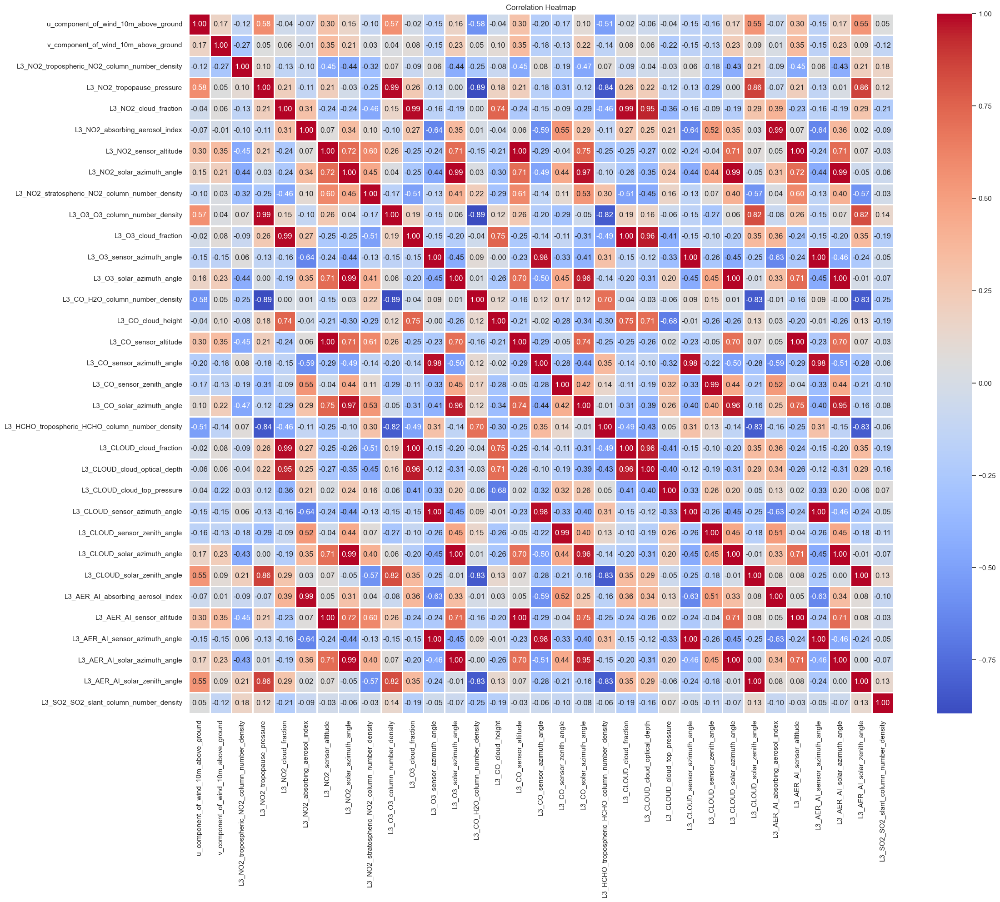

In [68]:
corr = df.corr()
plt.figure(figsize=(25, 20))
sb.heatmap(corr.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 2,
            annot = True)
plt.title('Correlation Heatmap')
plt.savefig('Correlation Heatmap_1.png')
plt.show()

In [69]:
corr

,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground,L3_NO2_tropospheric_NO2_column_number_density,L3_NO2_tropopause_pressure,L3_NO2_cloud_fraction,L3_NO2_absorbing_aerosol_index,L3_NO2_sensor_altitude,L3_NO2_solar_azimuth_angle,L3_NO2_stratospheric_NO2_column_number_density,L3_O3_O3_column_number_density,...,L3_CLOUD_sensor_azimuth_angle,L3_CLOUD_sensor_zenith_angle,L3_CLOUD_solar_azimuth_angle,L3_CLOUD_solar_zenith_angle,L3_AER_AI_absorbing_aerosol_index,L3_AER_AI_sensor_altitude,L3_AER_AI_sensor_azimuth_angle,L3_AER_AI_solar_azimuth_angle,L3_AER_AI_solar_zenith_angle,L3_SO2_SO2_slant_column_number_density
u_component_of_wind_10m_above_ground,1.000000,0.099346,-0.071527,0.280018,0.025892,0.013224,0.170965,0.099433,-0.040462,0.240795,...,-0.000035,-0.009181,0.115237,0.266847,0.010938,0.172625,-0.000117,0.117114,0.267108,0.018230
v_component_of_wind_10m_above_ground,0.099346,1.000000,-0.071682,0.033204,0.079685,0.021365,0.211727,0.110718,-0.034852,0.024202,...,-0.002159,-0.014625,0.137234,0.072804,0.040349,0.213666,-0.001601,0.137295,0.072885,-0.016983
L3_NO2_tropospheric_NO2_column_number_density,-0.071527,-0.071682,1.000000,0.062198,-0.098234,0.022960,-0.163844,-0.142187,-0.092297,0.037369,...,0.009878,-0.041100,-0.129526,0.142310,0.043077,-0.163292,0.008848,-0.129584,0.142616,0.078637
L3_NO2_tropopause_pressure,0.280018,0.033204,0.062198,1.000000,0.167178,-0.033194,0.206845,0.067746,-0.002936,0.844962,...,0.016791,-0.059377,0.088436,0.608251,-0.015720,0.208593,0.017247,0.096694,0.608778,0.069358
L3_NO2_cloud_fraction,0.025892,0.079685,-0.098234,0.167178,1.000000,0.296874,0.015783,0.008798,-0.197741,0.131065,...,0.007430,0.046790,0.039095,0.159234,0.307487,0.017379,0.007596,0.040719,0.159344,-0.052773
L3_NO2_absorbing_aerosol_index,0.013224,0.021365,0.022960,-0.033194,0.296874,1.000000,0.090428,0.231639,0.098719,-0.022658,...,-0.254633,0.322697,0.233142,0.034286,0.937881,0.090744,-0.251958,0.235789,0.033100,0.010517
L3_NO2_sensor_altitude,0.170965,0.211727,-0.163844,0.206845,0.015783,0.090428,1.000000,0.504611,0.406011,0.215050,...,0.014952,-0.013580,0.509302,0.120546,0.098378,0.999312,0.015770,0.508407,0.120141,0.027427
L3_NO2_solar_azimuth_angle,0.099433,0.110718,-0.142187,0.067746,0.008798,0.231639,0.504611,1.000000,0.172638,0.102444,...,-0.119378,0.298320,0.894838,0.017477,0.200237,0.500592,-0.116366,0.897967,0.016745,0.012879
L3_NO2_stratospheric_NO2_column_number_density,-0.040462,-0.034852,-0.092297,-0.002936,-0.197741,0.098719,0.406011,0.172638,1.000000,0.059450,...,-0.064957,-0.002490,0.136794,-0.500040,0.066375,0.403762,-0.064023,0.135603,-0.500550,-0.002500
L3_O3_O3_column_number_density,0.240795,0.024202,0.037369,0.844962,0.131065,-0.022658,0.215050,0.102444,0.059450,1.000000,...,0.011435,-0.053668,0.120983,0.539024,-0.015082,0.216915,0.011436,0.127843,0.539628,0.080781


# Writing a functions that determines and extracts highly correlated features

In [37]:
def high_corr_feat(corr_table, threshold=0.8):
    """
    Identifies features with high absolute correlation (above a threshold).

    Args:
        correlation_matrix: A Pandas DataFrame representing the correlation matrix.
        threshold: The absolute correlation threshold above which features are considered highly correlated.

    Returns:
        A dictionary where keys are features and values are lists of features they are highly correlated with.
    """

    high_corr = {}

    for i in range(len(corr_table.columns)):
        for j in range(i + 1, len(corr_table.columns)):
            col1 = corr_table.columns[i]
            col2 = corr_table.columns[j]
            corr = corr_table.iloc[i, j]

            if abs(corr) > threshold:
                if col1 not in high_corr:
                    high_corr[col1] = [col2]
                else:
                    high_corr[col1].append(col2)

                if col2 not in high_corr:  
                    high_corr[col2] = [col1]
                else:
                    high_corr[col2].append(col1)

    return high_corr

In [38]:
high_corr= high_corr_feat(corr, threshold= 0.69)
high_corr

NameError: name 'corr' is not defined

In [72]:
for feat, corr_feats in high_corr.items():
    for corr_feat in corr_feats:
        cor = df[corr_feat].corr(clean_data.target)
        print('Correlation between', corr_feat, 'and target:', cor)

Correlation between L3_O3_O3_column_number_density and target: -0.19736472257357093
Correlation between L3_NO2_tropopause_pressure and target: -0.22688606293156388
Correlation between L3_O3_cloud_fraction and target: -0.12414404028175015
Correlation between L3_CLOUD_cloud_fraction and target: -0.12481607220063437
Correlation between L3_NO2_cloud_fraction and target: -0.14150678053547297
Correlation between L3_CLOUD_cloud_fraction and target: -0.12481607220063437
Correlation between L3_CLOUD_cloud_optical_depth and target: -0.1255992701324808
Correlation between L3_NO2_cloud_fraction and target: -0.14150678053547297
Correlation between L3_O3_cloud_fraction and target: -0.12414404028175015
Correlation between L3_CLOUD_cloud_optical_depth and target: -0.1255992701324808
Correlation between L3_AER_AI_absorbing_aerosol_index and target: 0.020462756317972654
Correlation between L3_NO2_absorbing_aerosol_index and target: 0.03427436006283993
Correlation between L3_CO_sensor_altitude and target

In [73]:
df.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  L3_NO2_sensor_altitude  \
Date       Place_ID                                                           
2020-01-02 05EC30X                        -1.154956           837354.420102   
           0DPWHX8                        -0.678139           832512.542910   
           0TFOCOS                        -0.980939           831486.683666   
           11WPGRD                        -1.418169           829701.165312   
           168B2T2                        -1.519094           828942.116890   

                     L3_NO2_solar_azimuth_angle  \
Date       Place_ID                               
2020-01-02 05EC30X                   -73.610839   
           0DPWHX8                  -165.477337   
           0TFOCOS                  -159.136814   
           11WPGRD                  -155.692098   
           168B2T2                  -151.752796   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                         0.000048   
           0DPWHX8                                         0.000035   
           0TFOCOS                                         0.000035   
           11WPGRD                                         0.000032   
           168B2T2                                         0.000027   

                     L3_O3_O3_column_number_density  ...  \
Date       Place_ID                                  ...   
2020-01-02 05EC30X                         0.119525  ...   
           0DPWHX8                         0.166624  ...   
           0TFOCOS                         0.169304  ...   
           11WPGRD                         0.115481  ...   
           168B2T2                         0.109589  ...   

                     L3_CLOUD_sensor_azimuth_angle  \
Date       Place_ID                                  
2020-01-02 05EC30X                       76.274250   
           0DPWHX8                      -13.929141   
           0TFOCOS                      -98.027770   
           11WPGRD                      -99.534917   


In [39]:
d_col = ['L3_O3_O3_column_number_density', 'L3_CLOUD_cloud_fraction', 'L3_O3_cloud_fraction', 'L3_AER_AI_absorbing_aerosol_index',
'L3_NO2_sensor_altitude', 'L3_CO_sensor_altitude', 'L3_AER_AI_solar_azimuth_angle', 'L3_CLOUD_solar_azimuth_angle',
'L3_NO2_solar_azimuth_angle', 'L3_AER_AI_sensor_azimuth_angle', 'L3_CLOUD_sensor_azimuth_angle', 'L3_O3_sensor_azimuth_angle',
'L3_CLOUD_sensor_zenith_angle', 'L3_CLOUD_solar_zenith_angle', 'L3_AER_AI_solar_zenith_angle', 'L3_CLOUD_cloud_optical_depth',
'L3_CO_solar_azimuth_angle',       
        ]

df.drop(columns= d_col, inplace= True)
test_copy. drop(columns= d_col, inplace= True)


C:\Users\User\AppData\Local\Temp\ipykernel_14928\3919164602.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns= d_col, inplace= True)


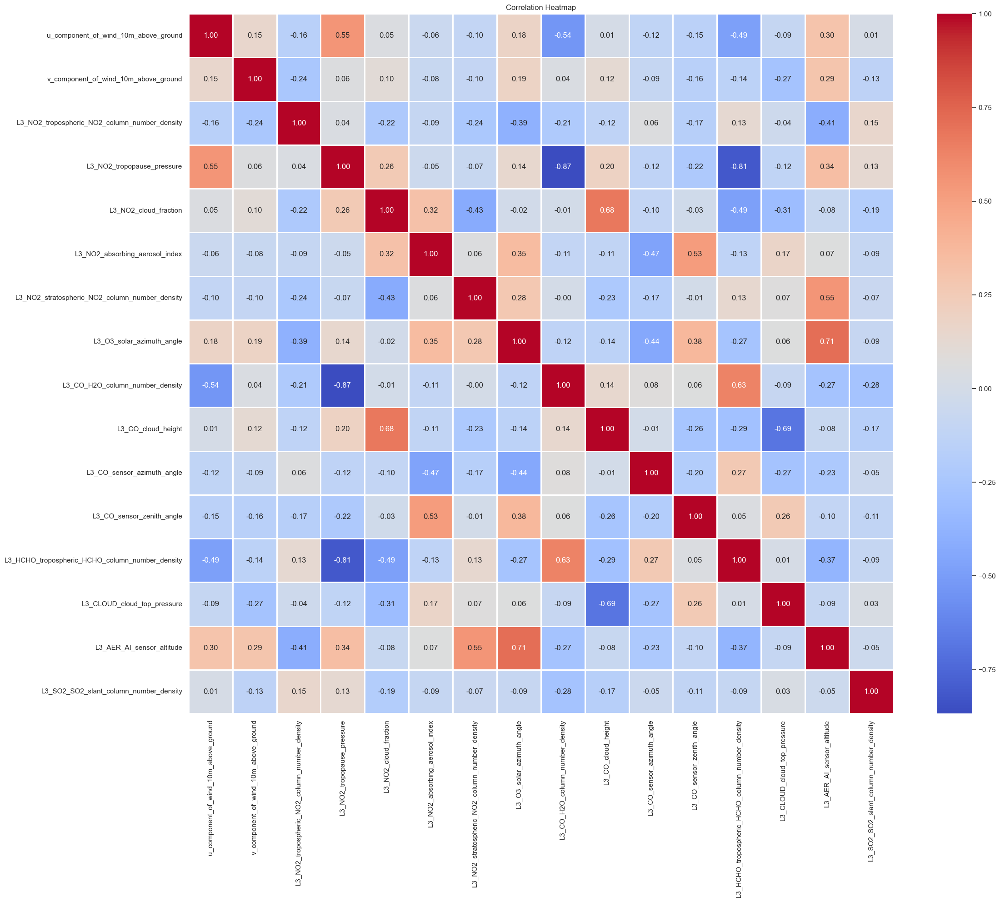

In [75]:
corr = df.corr()
plt.figure(figsize=(25, 20))
sb.heatmap(corr.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 2,
            annot = True)
plt.title('Correlation Heatmap')
plt.show()

In [76]:
df.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-01-02 05EC30X                        -1.154956   
           0DPWHX8                        -0.678139   
           0TFOCOS                        -0.980939   
           11WPGRD                        -1.418169   
           168B2T2                        -1.519094   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                         0.000048   
           0DPWHX8                                         0.000035   
           0TFOCOS                                         0.000035   
           11WPGRD                                         0.000032   
           168B2T2                                         0.000027   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-01-02 05EC30X                  -73.607722   
           0DPWHX8                 -165.477259   
           0TFOCOS                 -159.128657   
           11WPGRD                 -155.692098   
           168B2T2                 -151.752653   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-01-02 05EC30X                       1363.966144         1118.476411   
           0DPWHX8                        550.348909           15.588788   
           0TFOCOS                        435.978174         1643.930313   
           11WPGRD                       1356.988972         3735.128161   
           168B2T2                       2008.906954         1866.548216   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-01-02 05EC30X                    74.504741                  48.834644   
           0DPWHX8                   -13.912466                  57.797793   
           0TFOCOS                   -95.888275                  34.587362 

In [40]:
df['target']= clean_data['target']

C:\Users\User\AppData\Local\Temp\ipykernel_14928\1402267658.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target']= clean_data['target']


In [78]:
df.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-01-02 05EC30X                        -1.154956   
           0DPWHX8                        -0.678139   
           0TFOCOS                        -0.980939   
           11WPGRD                        -1.418169   
           168B2T2                        -1.519094   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                         0.000048   
           0DPWHX8                                         0.000035   
           0TFOCOS                                         0.000035   
           11WPGRD                                         0.000032   
           168B2T2                                         0.000027   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-01-02 05EC30X                  -73.607722   
           0DPWHX8                 -165.477259   
           0TFOCOS                 -159.128657   
           11WPGRD                 -155.692098   
           168B2T2                 -151.752653   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-01-02 05EC30X                       1363.966144         1118.476411   
           0DPWHX8                        550.348909           15.588788   
           0TFOCOS                        435.978174         1643.930313   
           11WPGRD                       1356.988972         3735.128161   
           168B2T2                       2008.906954         1866.548216   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-01-02 05EC30X                    74.504741                  48.834644   
           0DPWHX8                   -13.912466                  57.797793   
           0TFOCOS                   -95.888275                  34.587362 

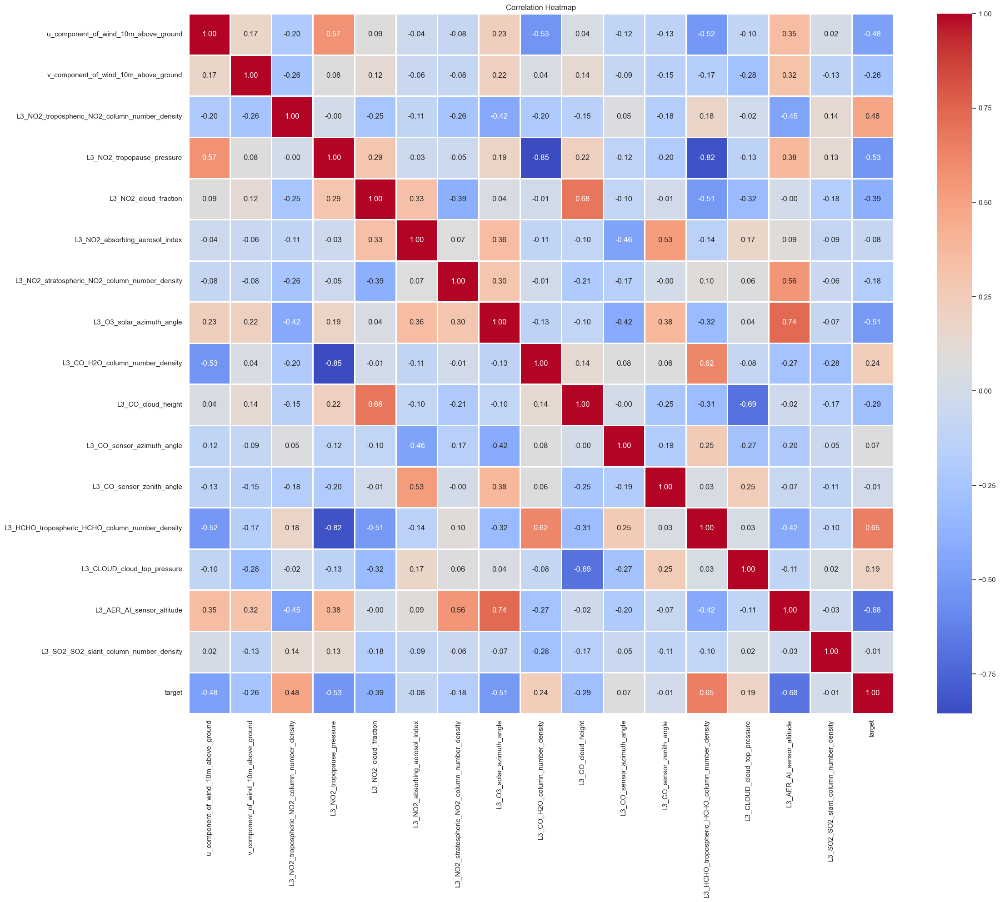

In [79]:
corr = df.corr()
plt.figure(figsize=(25, 20))
sb.heatmap(corr.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 2,
            annot = True)
plt.title('Correlation Heatmap')
plt.show()

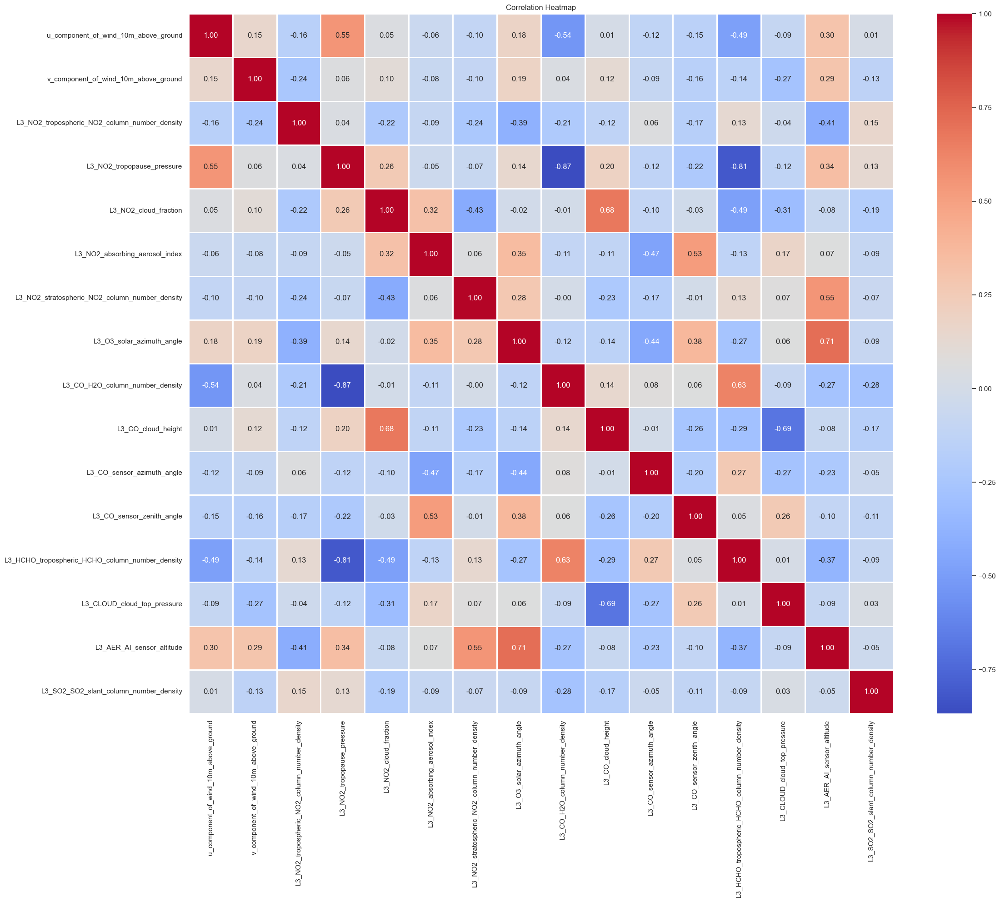

In [80]:
corr = df.drop(columns= ['target']).corr()
plt.figure(figsize=(25, 20))
sb.heatmap(corr.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 2,
            annot = True)
plt.title('Correlation Heatmap')
plt.show()

In [81]:
df.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-01-02 05EC30X                        -1.154956   
           0DPWHX8                        -0.678139   
           0TFOCOS                        -0.980939   
           11WPGRD                        -1.418169   
           168B2T2                        -1.519094   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                         0.000048   
           0DPWHX8                                         0.000035   
           0TFOCOS                                         0.000035   
           11WPGRD                                         0.000032   
           168B2T2                                         0.000027   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-01-02 05EC30X                  -73.607722   
           0DPWHX8                 -165.477259   
           0TFOCOS                 -159.128657   
           11WPGRD                 -155.692098   
           168B2T2                 -151.752653   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-01-02 05EC30X                       1363.966144         1118.476411   
           0DPWHX8                        550.348909           15.588788   
           0TFOCOS                        435.978174         1643.930313   
           11WPGRD                       1356.988972         3735.128161   
           168B2T2                       2008.906954         1866.548216   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-01-02 05EC30X                    74.504741                  48.834644   
           0DPWHX8                   -13.912466                  57.797793   
           0TFOCOS                   -95.888275                  34.587362 

In [41]:
print(len(df.columns))
print(len(test_copy.columns))

17
16


# checking the autocorrelation of PM2.5 daily average reading

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, ax = plt.subplots(figsize=(15, 6))
plot_acf(df.target , ax=ax)
plt.xlabel("Lag [hours]")
plt.ylabel("Correlation Coefficient")
plt.savefig('pacf.png');

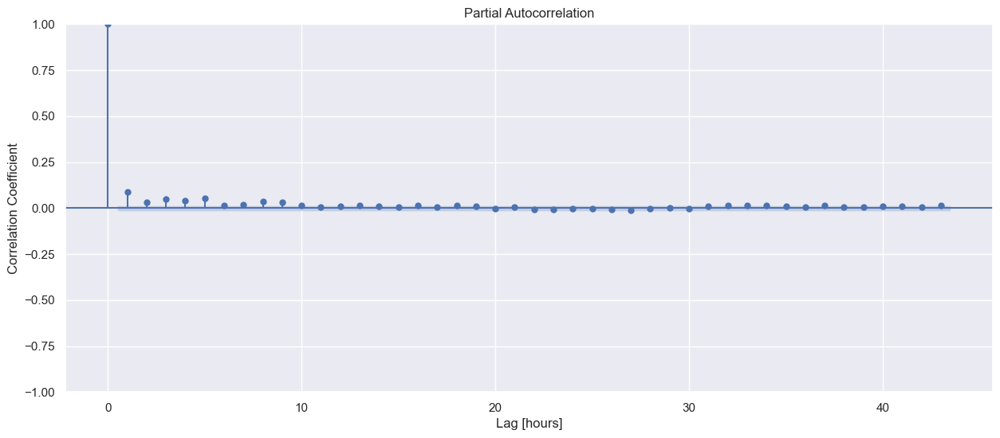

In [84]:
from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots(figsize=(15, 6))
plot_pacf(df.target , ax=ax)
plt.xlabel("Lag [hours]")
plt.ylabel("Correlation Coefficient")
plt.savefig('pacf.png');

In [85]:
clean_data.head()

target  target_min  target_max  target_variance  \
Date       Place_ID                                                    
2020-01-02 05EC30X     34.0        17.0        95.0          3298.58   
           0DPWHX8     73.0        63.0       101.0           846.74   
           0TFOCOS     34.0        13.0        74.0          1450.11   
           11WPGRD     74.0        57.0        85.0           622.54   
           168B2T2     76.0        13.0       153.0          7751.37   

                     target_count  precipitable_water_entire_atmosphere  \
Date       Place_ID                                                       
2020-01-02 05EC30X           23.0                             15.837500   
           0DPWHX8           64.0                             10.800000   
           0TFOCOS          118.0                              8.200000   
           11WPGRD           24.0                             22.700001   
           168B2T2           96.0                             31.900000   

                     relative_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                           61.737501   
           0DPWHX8                           87.700005   
           0TFOCOS                           73.400002   
           11WPGRD                           59.100002   
           168B2T2                           77.099998   

                     specific_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 05EC30X                            0.010854   
           0DPWHX8                            0.004550   
           0TFOCOS                            0.004050   
           11WPGRD                            0.008170   
           168B2T2                            0.013650   

                     temperature_2m_above_ground  \
Date       Place_ID                                
2020-01-02 05EC30X                     20.518076   
           0DPWHX8                      4.516840   
           0TFOCOS                      5.126825   
           11WPGRD                     19.366815   
           168B2T2                     23.206842   

                     u_component_of_wind_10m_above_ground  ...  \
Date       Place_ID                                        ...   
2020-01-02 05EC30X                               2.775127  ...   
           0DPWHX8                               0.466377  ...   
           0TFOCOS                              -1.983623  ...   
           11WPGRD                               2.816377  ...   
           168B2T2                              -2.483623  ...   

                     L3_AER_AI_solar_zenith_angle  \
Date       Place_ID                                 
2020-01-02 05EC30X                      17.462130   
           0DPWHX8                      66.165863   
           0TFOCOS                      63.854531   
           11WPGRD                      53.206200   
           168B2T2                      41.145168   

                     L3_SO2_SO2_column_number_density  \
Date       Place_ID                                     
2020-01-02 05EC30X                          -0.000134   
           0DPWHX8                           0.000473   
           0TFOCOS                          -0.000316   
           11WPGRD                           0.000157   
           168B2T2                           0.000077   

                     L3_SO2_SO2_column_number_density_amf  \
Date       Place_ID                                         
2020-01-02 05EC30X                               0.588153   
           0DPWHX8                               0.365748   
           0TFOCOS                               0.640051   
           11WPGRD                               0.472042   
           168B2T2                               0.646589   

                     L3_SO2_SO2_slant_column_number_density  \
Date       Place_ID                                           
2020-01-02 05EC30X    

In [44]:
df.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                               2.775127   
           0DPWHX8                               0.466377   
           0TFOCOS                              -1.983623   
           11WPGRD                               2.816377   
           168B2T2                              -2.483623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                              -4.174895   
           0DPWHX8                              -1.797395   
           0TFOCOS                              -5.547395   
           11WPGRD                              -4.137395   
           168B2T2                              -1.967395   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                        0.000025   
           0DPWHX8                                        0.000050   
           0TFOCOS                                        0.000017   
           11WPGRD                                        0.000086   
           168B2T2                                        0.000028   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                  7311.869141               0.030351   
           0DPWHX8                 22142.909721               0.442999   
           0TFOCOS                 20741.478284               0.559125   
           11WPGRD                  6156.074219               0.144360   
           168B2T2                  7311.869141               0.085562   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-01-02 05EC30X                        -1.154956   
           0DPWHX8                        -0.678139   
           0TFOCOS                        -0.980939   
           11WPGRD                        -1.418169   
           168B2T2                        -1.519094   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                         0.000048   
           0DPWHX8                                         0.000035   
           0TFOCOS                                         0.000035   
           11WPGRD                                         0.000032   
           168B2T2                                         0.000027   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-01-02 05EC30X                  -73.607722   
           0DPWHX8                 -165.477259   
           0TFOCOS                 -159.128657   
           11WPGRD                 -155.692098   
           168B2T2                 -151.752653   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-01-02 05EC30X                       1363.966144         1118.476411   
           0DPWHX8                        550.348909           15.588788   
           0TFOCOS                        435.978174         1643.930313   
           11WPGRD                       1356.988972         3735.128161   
           168B2T2                       2008.906954         1866.548216   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-01-02 05EC30X                    74.504741                  48.834644   
           0DPWHX8                   -13.912466                  57.797793   
           0TFOCOS                   -95.888275                  34.587362 

In [43]:
print(df.shape)
print(test_copy.shape)

(18468, 17)
(16136, 16)


In [73]:
test_data.head()

precipitable_water_entire_atmosphere  \
Date       Place_ID                                         
2020-01-02 0OS9LVX                              11.600000   
           1BD5TVT                              33.400002   
           1PILPB3                               6.000000   
           1WV2OIN                              28.700001   
           27N3G71                               8.700000   

                     relative_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 0OS9LVX                           30.200001   
           1BD5TVT                           86.800003   
           1PILPB3                           53.500000   
           1WV2OIN                           88.700005   
           27N3G71                           76.300003   

                     specific_humidity_2m_above_ground  \
Date       Place_ID                                      
2020-01-02 0OS9LVX                             0.00409   
           1BD5TVT                             0.01262   
           1PILPB3                             0.00307   
           1WV2OIN                             0.01377   
           27N3G71                             0.00430   

                     temperature_2m_above_ground  \
Date       Place_ID                                
2020-01-02 0OS9LVX                     14.656824   
           1BD5TVT                     20.256830   
           1PILPB3                      5.686823   
           1WV2OIN                     19.566827   
           27N3G71                      5.606836   

                     u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 0OS9LVX                               3.956377   
           1BD5TVT                              -1.443623   
           1PILPB3                               0.156377   
           1WV2OIN                              -2.843623   
           27N3G71                              -0.183623   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 0OS9LVX                               0.712605   
           1BD5TVT                               0.922605   
           1PILPB3                              -0.117395   
           1WV2OIN                               1.002605   
           27N3G71                               0.382605   

                     L3_NO2_NO2_column_number_density  \
Date       Place_ID                                     
2020-01-02 0OS9LVX                           0.000053   
           1BD5TVT                           0.000091   
           1PILPB3                           0.000072   
           1WV2OIN                           0.000062   
           27N3G71                           0.000053   

                     L3_NO2_NO2_slant_column_number_density  \
Date       Place_ID                                           
2020-01-02 0OS9LVX                                 0.000108   
           1BD5TVT                                 0.000156   
           1PILPB3                                 0.000185   
           1WV2OIN                                 0.000113   
           27N3G71                                 0.000136   

                     L3_NO2_absorbing_aerosol_index  L3_NO2_cloud_fraction  \
Date       Place_ID                                                          
2020-01-02 0OS9LVX                         0.466171               0.010752   
           1BD5TVT                        -0.511637               0.716203   
           1PILPB3                        -1.261152               0.089141   
           1WV2OIN                        -1.347483               0.278595   
           27N3G71                        -1.139223               0.298400   

                     ...  L3_AER_AI_solar_zenith_angle  \
Date       Place_ID  ...                                 
2020-01-02 0OS9LVX   ...                     22.94201

# Splitting the data into target and predictors as well as train and test split

In [45]:
X= df.drop(columns= ['target'])
y= df['target']

cutoff = int(len(X) * 0.8)

X_train, y_train = X.iloc[:cutoff], y.iloc[:cutoff]
X_test, y_test = X.iloc[cutoff:], y.iloc[cutoff:]

# Transforming the data to using the standard scaler

In [46]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_norm = scaler.transform(X_train).round(2)
X_test_norm = scaler.transform(X_test).round(2)
test_norm= scaler.transform(test_copy).round(2)

X_train_norm= pd.DataFrame(X_train_norm, columns= X_train.columns, index= X_train.index)
X_test_norm= pd.DataFrame(X_test_norm, columns= X_test.columns, index=X_test.index)
test_norm= pd.DataFrame(test_norm, columns= test_copy.columns)

In [47]:
X_train_norm.set_index(X_train.index, inplace=True)
X_test_norm.set_index(X_test.index, inplace=True)
test_norm.set_index(test_copy.index, inplace=True)

In [48]:
X_train_norm.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                                   0.89   
           0DPWHX8                                  -0.01   
           0TFOCOS                                  -0.96   
           11WPGRD                                   0.90   
           168B2T2                                  -1.15   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-01-02 05EC30X                                  -1.67   
           0DPWHX8                                  -0.73   
           0TFOCOS                                  -2.21   
           11WPGRD                                  -1.65   
           168B2T2                                  -0.80   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-01-02 05EC30X                                           -0.67   
           0DPWHX8                                           -0.03   
           0TFOCOS                                           -0.87   
           11WPGRD                                            0.89   
           168B2T2                                           -0.58   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-01-02 05EC30X                        -1.16                  -0.85   
           0DPWHX8                         1.35                   0.61   
           0TFOCOS                         1.12                   1.02   
           11WPGRD                        -1.36                  -0.45   
           168B2T2                        -1.16                  -0.65   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-01-02 05EC30X                             0.22   
           0DPWHX8                             1.21   
           0TFOCOS                             0.58   
           11WPGRD                            -0.33   
           168B2T2                            -0.54   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-01-02 05EC30X                                             1.56   
           0DPWHX8                                            -0.02   
           0TFOCOS                                             0.08   
           11WPGRD                                            -0.28   
           168B2T2                                            -0.86   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-01-02 05EC30X                        0.86   
           0DPWHX8                       -0.60   
           0TFOCOS                       -0.50   
           11WPGRD                       -0.45   
           168B2T2                       -0.39   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-01-02 05EC30X                              0.57               -0.15   
           0DPWHX8                             -0.58               -0.97   
           0TFOCOS                             -0.74                0.24   
           11WPGRD                              0.56                1.78   
           168B2T2                              1.49                0.40   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-01-02 05EC30X                         1.19                       0.75   
           0DPWHX8                        -0.00                       1.24   
           0TFOCOS                        -1.11                      -0.04 

In [49]:
X_test_norm.head()

u_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-03-13 3EJ33BJ                                  -0.01   
           3H1DEPM                                   0.58   
           3HTVI1M                                   0.08   
           3MXSVYJ                                   1.88   
           3V177MC                                  -1.13   

                     v_component_of_wind_10m_above_ground  \
Date       Place_ID                                         
2020-03-13 3EJ33BJ                                   0.37   
           3H1DEPM                                  -0.30   
           3HTVI1M                                  -0.94   
           3MXSVYJ                                   2.52   
           3V177MC                                   1.44   

                     L3_NO2_tropospheric_NO2_column_number_density  \
Date       Place_ID                                                  
2020-03-13 3EJ33BJ                                            1.14   
           3H1DEPM                                           -0.58   
           3HTVI1M                                           -0.11   
           3MXSVYJ                                            0.06   
           3V177MC                                           -1.11   

                     L3_NO2_tropopause_pressure  L3_NO2_cloud_fraction  \
Date       Place_ID                                                      
2020-03-13 3EJ33BJ                         1.33                  -0.82   
           3H1DEPM                        -1.16                  -0.95   
           3HTVI1M                        -1.16                   2.06   
           3MXSVYJ                         0.86                  -0.05   
           3V177MC                        -1.16                   1.68   

                     L3_NO2_absorbing_aerosol_index  \
Date       Place_ID                                   
2020-03-13 3EJ33BJ                            -0.33   
           3H1DEPM                            -0.12   
           3HTVI1M                             1.00   
           3MXSVYJ                            -0.40   
           3V177MC                             1.87   

                     L3_NO2_stratospheric_NO2_column_number_density  \
Date       Place_ID                                                   
2020-03-13 3EJ33BJ                                             0.67   
           3H1DEPM                                             0.34   
           3HTVI1M                                             0.52   
           3MXSVYJ                                             0.30   
           3V177MC                                             1.22   

                     L3_O3_solar_azimuth_angle  \
Date       Place_ID                              
2020-03-13 3EJ33BJ                       -0.58   
           3H1DEPM                       -0.47   
           3HTVI1M                       -0.63   
           3MXSVYJ                        2.23   
           3V177MC                        1.09   

                     L3_CO_H2O_column_number_density  L3_CO_cloud_height  \
Date       Place_ID                                                        
2020-03-13 3EJ33BJ                             -0.78               -0.60   
           3H1DEPM                             -0.46               -0.97   
           3HTVI1M                              2.00                0.18   
           3MXSVYJ                              0.35                0.48   
           3V177MC                              1.16                0.24   

                     L3_CO_sensor_azimuth_angle  L3_CO_sensor_zenith_angle  \
Date       Place_ID                                                          
2020-03-13 3EJ33BJ                         0.85                      -1.79   
           3H1DEPM                         1.10                       0.76   
           3HTVI1M                         1.07                       1.18 

In [50]:
test_norm.head()

,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground,L3_NO2_tropospheric_NO2_column_number_density,L3_NO2_tropopause_pressure,L3_NO2_cloud_fraction,L3_NO2_absorbing_aerosol_index,L3_NO2_stratospheric_NO2_column_number_density,L3_O3_solar_azimuth_angle,L3_CO_H2O_column_number_density,L3_CO_cloud_height,L3_CO_sensor_azimuth_angle,L3_CO_sensor_zenith_angle,L3_HCHO_tropospheric_HCHO_column_number_density,L3_CLOUD_cloud_top_pressure,L3_AER_AI_sensor_altitude,L3_SO2_SO2_slant_column_number_density
0,1.35,0.26,-1.10,-1.36,-0.92,3.60,1.31,0.50,-0.17,-0.86,0.62,-1.83,0.11,0.11,1.13,1.45
1,1.45,0.24,-1.16,-1.16,-0.86,2.18,1.21,0.52,0.32,-0.30,1.18,-0.03,-0.06,-1.46,1.00,-0.11
2,1.85,0.62,-1.13,-1.36,-0.92,2.10,1.09,0.53,-0.02,-0.03,1.18,1.14,-0.47,-0.81,0.85,0.89
3,1.93,-0.10,-0.99,-1.36,-0.64,2.07,0.96,0.48,-0.12,-0.32,-1.17,1.32,-0.84,0.13,1.33,0.99
4,1.17,-0.13,-1.09,-1.36,-0.81,3.59,1.44,0.50,-0.41,-0.98,-1.17,0.32,-1.34,0.13,1.26,0.37


# Performing Principal Component Analysis

In [56]:
from sklearn.decomposition import PCA
numFolds = 16

pca = PCA(n_components = numFolds)
pca.fit(X_train_norm)

PCA(n_components=16)

# Checking the loading/weights of each component

In [57]:
pca.components_

array([[ 3.38294399e-01,  1.84718560e-01, -8.88951407e-02,
         4.72423374e-01,  2.48352655e-01,  1.70524140e-01,
         1.92499623e-02,  3.04106355e-01, -3.25398941e-01,
         1.61263698e-01, -1.20776308e-01,  3.52302379e-02,
        -4.00766600e-01, -8.38601063e-02,  3.44131618e-01,
         5.43093865e-02],
       [-4.88308986e-02,  8.80949575e-02, -1.99996762e-01,
        -2.66352523e-01, -8.49241427e-02,  3.29191184e-01,
         3.95981140e-01,  4.26830453e-01,  2.45079481e-01,
        -1.81705064e-01, -1.38564288e-01,  3.17656379e-01,
         2.25344935e-01,  1.76589827e-01,  3.58602987e-01,
        -2.45250346e-02],
       [-1.40089605e-01,  2.27547165e-01, -1.85049648e-01,
        -1.60062005e-01,  4.24945801e-01, -2.50848656e-04,
        -5.09385344e-02,  2.98992242e-02,  4.32188086e-01,
         5.49751124e-01,  8.72343977e-02, -5.68080552e-02,
         5.26006744e-02, -3.88860986e-01,  3.83964677e-02,
        -1.71354769e-01],
       [-1.30752984e-01, -2.04198355e

# Checking the variance that each component explains

In [58]:
pca.explained_variance_ratio_

array([0.15158925, 0.1277383 , 0.10975846, 0.09475514, 0.06945377,
       0.06375888, 0.05988964, 0.05672686, 0.05019039, 0.04684755,
       0.04362453, 0.03781762, 0.03127508, 0.02123895, 0.01837362,
       0.01696196])

# checking the total variance explained by the principal components

In [59]:
pca.explained_variance_ratio_.sum()

1.0

# Checking the cummulative variance explained by the principal components

In [60]:
pca.explained_variance_ratio_.cumsum()


array([0.15158925, 0.27932755, 0.38908601, 0.48384115, 0.55329492,
       0.6170538 , 0.67694344, 0.73367029, 0.78386069, 0.83070823,
       0.87433277, 0.91215039, 0.94342547, 0.96466442, 0.98303804,
       1.        ])

# Extracting components that explain 95% variance in the data

In [61]:
comp_num= np.argmax(pca.explained_variance_ratio_.cumsum() >= 0.95) + 1
comp_num

14

# fitting and transforming the data using the principal components that explain 95% of the variability in the data

In [62]:
new_pca = PCA(n_components=comp_num)
new_pca.fit(X_train_norm)

PCA(n_components=14)

In [64]:
print(X_train.isna().sum().sum())
print(X_test.isna().sum().sum())
print(test_copy.isna().sum().sum())

0
0
0


In [65]:
X_train_pca= new_pca.transform(X_train_norm)
X_test_pca= new_pca.transform(X_test_norm)
test_pca= new_pca.transform(test_norm)

In [66]:
X_train_pca= pd.DataFrame(X_train_pca, index= X_train.index)
X_test_pca= pd.DataFrame(X_test_pca, index= X_test.index)
test_pca= pd.DataFrame(test_pca, index= test_copy.index)

# Getting the baseline mae

In [68]:
from sklearn.metrics import mean_absolute_error
y_mean= y_train.mean()
y_pred = [y_mean] * len(y_train)
mae_baseline = mean_absolute_error(y_train, y_pred)
print("Mean P2 Reading:", round(y_mean, 2))
print("Baseline MAE:", round(mae_baseline, 2))

Mean P2 Reading: 56.36
Baseline MAE: 29.92


# Training and testing a model using the mean absolute error metric

In [69]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=7)
model.fit(X_train, y_train)

pred= model.predict(X_test)

test_mae = mean_absolute_error(y_test, pred)
print("Test MAE:", round(test_mae, 2))

Test MAE: 19.7


# Creating a Data Frame to store the predictions

In [70]:
test_pred = pd.DataFrame(pred)
test_pred.index= y_test.index
test_pred.columns= ['predictions']
test_pred

predictions
Date       Place_ID             
2020-03-13 3EJ33BJ        67.210
           3H1DEPM        90.682
           3HTVI1M        90.460
           3MXSVYJ        29.960
           3V177MC        22.590
...                          ...
2020-03-27 YCXA4V5        38.810
           YJENTFL        37.940
           YLLOKEY        71.350
           YLZOBFW        21.320
           YSIXKFZ        65.040

[3694 rows x 1 columns]

# comparing historical PM2.5 reading with the predicted readings

In [71]:
df_pred_test = pd.DataFrame(y_test).copy()
df_pred_test['y_pred'] = test_pred
df_pred_test

target  y_pred
Date       Place_ID                
2020-03-13 3EJ33BJ     76.0  67.210
           3H1DEPM     70.0  90.682
           3HTVI1M     53.0  90.460
           3MXSVYJ     27.0  29.960
           3V177MC     18.0  22.590
...                     ...     ...
2020-03-27 YCXA4V5     55.0  38.810
           YJENTFL     46.0  37.940
           YLLOKEY     89.0  71.350
           YLZOBFW     15.0  21.320
           YSIXKFZ     93.0  65.040

[3694 rows x 2 columns]

# Plotting the visual to compare the the historical and predicted PM2.5 reading

In [72]:
import plotly.express as px
df_pred_test.reset_index(inplace= True)
df_pred_test.drop(columns= 'Place_ID', inplace= True)
df_pred_test.set_index('Date', inplace= True)
df_pred_test.index= pd.to_datetime(df_pred_test.index)

fig = px.line(df_pred_test.rolling(window= '7D', min_periods= 1).mean(), labels= {'value':'P2'})
fig.show() 


KeyboardInterrupt

Exception ignored in: 'zmq.backend.cython.message.Frame.__dealloc__'
Traceback (most recent call last):
  File "zmq\\backend\\cython\\checkrc.pxd", line 13, in zmq.backend.cython.checkrc._check_rc
KeyboardInterrupt: 
